## 1. Library import

In [1]:
%matplotlib inline

import os
from tqdm import tqdm
from glob import glob
from datetime import datetime
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
import warnings
import geopandas as gpd
import plotly.express as px
import json
warnings.filterwarnings(action='ignore')


plt.rc('font', family='NanumBarunGothic') # matplotlib 한글 폰트 설정
plt.rcParams['axes.unicode_minus'] = False
sns.set(font="NanumGothic", style="whitegrid")  # seaborn 한글 폰트 설정

## 2. User defined function

In [2]:
def load_data(paths, names):
    df = pd.DataFrame()
    for path in tqdm(paths):
        temp_df = pd.read_csv(path, header=None, names=names)
        temp_df.drop(columns=['고유번호'], inplace=True)
        temp_df['등록일시'] = temp_df['등록일시'].apply(modify_datetime)
        temp_df['등록월'] = temp_df['등록일시'].apply(extract_month)
        df = pd.concat([df, temp_df], axis=0)
    return df

def modify_datetime(date_time):
    return datetime.strptime(date_time[:8], '%Y%m%d')

def extract_month(date_time):
    return date_time.strftime('%Y-%m')

def modify_age_section(df):
    cond_ord_1 = df['생년구간'] == '2070-2080'
    cond_ord_2 = df['생년구간'] == '2080-2090'
    df = df.drop(df[cond_ord_1 | cond_ord_2].index)

    cond_1 = df['생년구간'] == '2000-2010'
    cond_2 = df['생년구간'] == '2010-2020'
    df.loc[cond_1 | cond_2, '생년구간'] = '2000-2020'

    cond_3 = df['생년구간'] == '1980-1990'
    cond_4 = df['생년구간'] == '1990-2000'
    df.loc[cond_3 | cond_4, '생년구간'] = '1980-2000'

    cond_5 = df['생년구간'] == '1960-1970'
    cond_6 = df['생년구간'] == '1970-1980'
    df.loc[cond_5 | cond_6, '생년구간'] = '1960-1980'

    cond_7 = df['생년구간'] == '1940-1950'
    cond_8 = df['생년구간'] == '1950-1960'
    df.loc[cond_7 | cond_8, '생년구간'] = '1940-1960'

    cond_high = ~(cond_1 | cond_2 | cond_3 | cond_4 | cond_5 | cond_6 | cond_7 | cond_8)
    df.loc[cond_high, '생년구간'] = '고령층'
    return df

def modify_mc(mc):
    if 'LG' in mc:
        mc = 'LG U+'
    elif 'SK' in mc:
        mc = 'SKT'
    elif 'Korea Telecom' == mc:
        mc = 'KT'
    else:
        mc = 'etc'
    return mc

def modify_city(city):
    city_mapping = {
        'Seoul': '서울특별시',
        'Incheon': '인천광역시',
        'Gyeonggi-do': '경기도',
    }

    metropolitan_area = ['서울특별시', '안천광역시', '경기도']

    if city in city_mapping:
        city = city_mapping[city]

    if city not in metropolitan_area:
        return '비수도권'
    else:
        return '수도권'

def change_bank_code(code):
    bank_mapping = {
        90 : '카카오뱅크',
        4 : '국민',
        12 : '단위농협',
        92 : '토스',
        3 : '기업',
        89 : 'K',
        88 : '신한',
        20 : '우리',
        81 : '하나',
        45 : '새마을',
        11 : '농협',
        48 : '신협',
        50 : '상호저축',
        32 : '부산',
        71 : '우체국',
        23 : 'SC제일',
        31 : '대구',
        34 : '광주',
        39 : '경남',
    }
    return '기타' if code not in bank_mapping.keys() else  bank_mapping.get(code)

def change_stock_code(code):
    stock_mapping = {
        288 : '카카오페이증권',
        230 : '미래증권',
        271 : '토스증권',
        226 : 'KB증',
        240 : '삼성증권',
        247 : 'NH투자증권',
        278 : '신한금융투자증권',
        280 : '유진투자증권',
        270 : '하나금융투자증권',
        264 : '키움증권',
        243 : '한국투자증권',
        265 : '신협',
        269 : '한화투자증권',
        267 : '대신증권',
        261 : '교보증권',
        266 : 'SK증권',
        225 : 'IBK투자증권',
        209 : '유안타증권',
        262 : '하이투자증권',
    }
    return '기타' if code not in stock_mapping.keys() else  stock_mapping.get(code)

def mean_amount(amount):
    price = amount.split('-')
    return int((int(price[1]) + int(price[0])) / 2)

def min_amount(amount):
    return int(amount.split('-')[0])

def amount_to_korean(amount):
    if not isinstance(amount, int):
        return "입력값은 정수여야 합니다."

    units = [
        (1e12, '조'), (1e8, '억'), (1e4, '만'),
        (1e12, '천억'), (1e8, '백억'), (1e4, '십억'),
        (1e12, '천억'), (1e8, '백억'), (1e4, '십억'),
        (1e12, '조'), (1e8, '억'), (1e4, '만')
    ]

    result = ""

    for unit, unit_name in units:
        if amount >= unit:
            num = int(amount / unit)
            amount %= unit

            if num > 1:
                result += f"{num}{unit_name} "
            elif num == 1:
                result += f"1{unit_name} "

    if amount > 0:
        result += f"{int(amount):,}"


    return result.split()[0] + " 원"

## 금융 사기 피해자 데이터 전처리

In [3]:
# 성별 피해자 데이터
ff_victim_sex_df = load_data([f"./data/금융사기 피해자/성별/{x}" for x in os.listdir('./data/금융사기 피해자/성별')], names=['고유번호', '성별', '광역도시명', '법정시군구명', '등록일시'])
ff_victim_sex_df['광역도시명'] = ff_victim_sex_df['광역도시명'].apply(modify_city)

# 지역 데이터
ff_victim_region_df = load_data([f"./data/금융사기 피해자/지역/{x}" for x in os.listdir('./data/금융사기 피해자/지역')], names=['고유번호', '생년구간', '광역도시명', '법정시군구명', '등록일시'])
ff_victim_region_df['광역도시명'] = ff_victim_region_df['광역도시명'].apply(modify_city)
ff_victim_region_df = modify_age_section(ff_victim_region_df)

# 연령대 및 금액 데이터
ff_victim_amount_df = load_data([f"./data/금융사기 피해자/연령대/{x}" for x in os.listdir('./data/금융사기 피해자/연령대')], names=['고유번호', '생년구간', '평균금액', '등록일시'])
ff_victim_amount_df['평균금액'] = ff_victim_amount_df['평균금액'].apply(mean_amount)
ff_victim_amount_df = modify_age_section(ff_victim_amount_df)

# 발생횟수 데이터
ff_num_of_occur_df = load_data([f"./data/금융사기 피해자/발생건수/{x}" for x in os.listdir('./data/금융사기 피해자/발생건수')], names=['고유번호', '등록일시', '피해발생수'])


# 연령대별 피해발생사이트 데이터
ff_site_age_df = load_data([f"./data/금융사기 피해자/피해발생사이트/연령대/{x}" for x in os.listdir('./data/금융사기 피해자/피해발생사이트/연령대')], names=['고유번호', '생년구간', '피해발생사이트', '등록일시'])

cond = ff_site_age_df['피해발생사이트'].value_counts() < 500
ff_site_age_df['피해발생사이트'] = np.where(ff_site_age_df['피해발생사이트'].isin(cond[cond].index), '기타', ff_site_age_df['피해발생사이트'])
ff_site_age_df.drop(ff_site_age_df.loc[ff_site_age_df['피해발생사이트'] == '기타'].index, inplace=True)
ff_site_age_df = modify_age_section(ff_site_age_df)

# 성별 피해발생사이트 데이터
ff_site_sex_df = load_data([f"./data/금융사기 피해자/피해발생사이트/성별/{x}" for x in os.listdir('./data/금융사기 피해자/피해발생사이트/성별')],  names=['고유번호', '성별', '피해발생사이트', '등록일시'])

# 입금은행 성별 데이터
ff_bank_sex_df = load_data([f"./data/금융사기 피해자/입금은행/성별/{x}" for x in os.listdir('./data/금융사기 피해자/입금은행/성별')], names=['고유번호', '성별', '은행', '등록일시'])
ff_bank_sex_df['은행'] = ff_bank_sex_df['은행'].apply(change_bank_code)

# 입금은행 연령대 데이터
ff_bank_age_df = load_data([f"./data/금융사기 피해자/입금은행/연령대/{x}" for x in os.listdir('./data/금융사기 피해자/입금은행/연령대')], names=['고유번호', '생년구간', '은행', '등록일시'])
ff_bank_age_df['은행'] = ff_bank_age_df['은행'].apply(change_bank_code)
ff_bank_age_df = modify_age_section(ff_bank_age_df)

# 증권사 성별 데이터
ff_stock_sex_df = load_data([f"./data/금융사기 피해자/증권/성별/{x}" for x in os.listdir('./data/금융사기 피해자/증권/성별')], names=['고유번호', '성별', '증권사', '등록일시'])
ff_stock_sex_df['증권사'] = ff_stock_sex_df['증권사'].apply(change_stock_code)

# 증권사 연령대 데이터
ff_stock_age_df = load_data([f"./data/금융사기 피해자/증권/연령대/{x}" for x in os.listdir('./data/금융사기 피해자/증권/연령대')], names=['고유번호', '생년구간', '증권사', '등록일시'])
ff_stock_age_df['증권사'] = ff_stock_age_df['증권사'].apply(change_stock_code)
ff_stock_age_df = modify_age_section(ff_stock_age_df)

# 핀테크 성별 데이터
ff_fintech_df = load_data([f"./data/금융사기 피해자/핀테크/성별/{x}" for x in os.listdir('./data/금융사기 피해자/핀테크/성별')], names=['고유번호', '성별', '핀테크명', '등록일시'])

# 피해물품 데이터
ff_goods_df = load_data([f"./data/금융사기 피해자/피해물품데이터/{x}" for x in os.listdir('./data/금융사기 피해자/피해물품데이터')], names=['고유번호', '성별', '피해물품', '등록일시'])
ff_goods_df.drop(ff_goods_df.loc[ff_goods_df['피해물품'] == '기타'].index, inplace=True)

  0%|          | 0/22 [00:00<?, ?it/s]

100%|██████████| 22/22 [00:07<00:00,  2.88it/s]


## 성별 금융사기 피해 현황

남성이 여성보다 사기 발생이 많고 주로 수도권 지역에서 금융사기가 일어났음

In [4]:
ff_victim_sex_df

,성별,광역도시명,법정시군구명,등록일시,등록월
0,남자,수도권,남양주시,2022-01-01,2022-01
1,여자,비수도권,남구,2022-01-01,2022-01
2,남자,수도권,송파구,2022-01-01,2022-01
3,남자,비수도권,아산시,2022-01-01,2022-01
4,남자,비수도권,아산시,2022-01-01,2022-01
...,...,...,...,...,...
12885,남자,비수도권,북구,2023-10-31,2023-10
12886,남자,수도권,동대문구,2023-10-31,2023-10
12887,남자,비수도권,천안시동남구,2023-10-31,2023-10
12888,남자,비수도권,서구,2023-10-31,2023-10


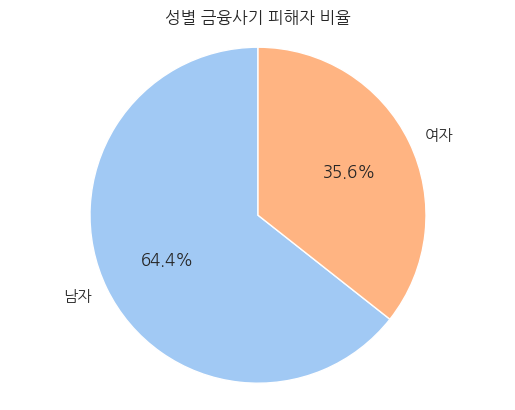

In [5]:
labels = ff_victim_sex_df['성별'].value_counts()
colors = sns.color_palette("pastel")[0:len(labels)]

fig, ax = plt.subplots()
plt.title('성별 금융사기 피해자 비율')
ax.pie(labels.values, labels=labels.index, autopct='%1.1f%%', startangle=90, colors=colors)
ax.axis('equal')
plt.show()

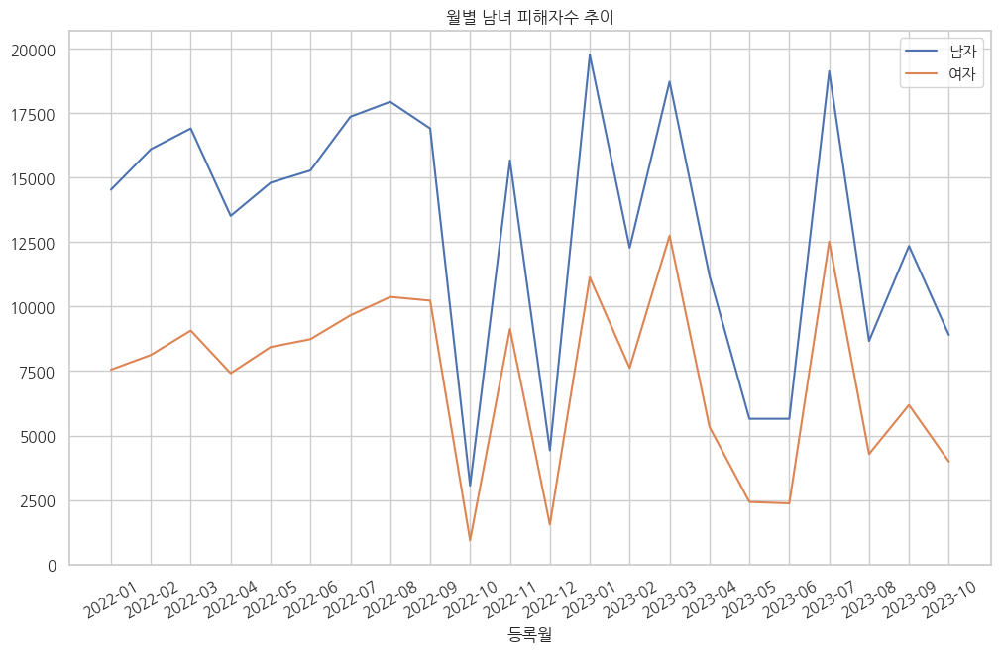

In [6]:
men = ff_victim_sex_df.loc[ff_victim_sex_df.성별 == '남자'].groupby('등록월').size()
women = ff_victim_sex_df.loc[ff_victim_sex_df.성별 == '여자'].groupby('등록월').size()

plt.figure(figsize=(12,7))
plt.title('월별 남녀 피해자수 추이')
sns.lineplot(men, label='남자')
sns.lineplot(women, label='여자')
plt.xticks(rotation=30)
plt.legend()
plt.show()

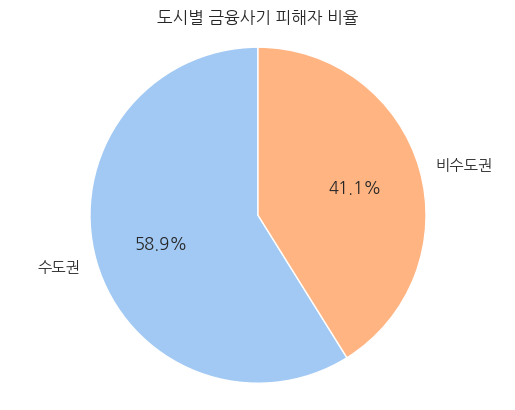

In [7]:
data = ff_victim_sex_df['광역도시명'].value_counts()
colors = sns.color_palette("pastel")[0:len(data)]

fig, ax = plt.subplots()
plt.title('도시별 금융사기 피해자 비율')
ax.pie(data.values, labels=data.index, autopct='%1.1f%%', startangle=90, colors=colors)
ax.axis('equal')
plt.show()

## 나이대 별 피해 현황

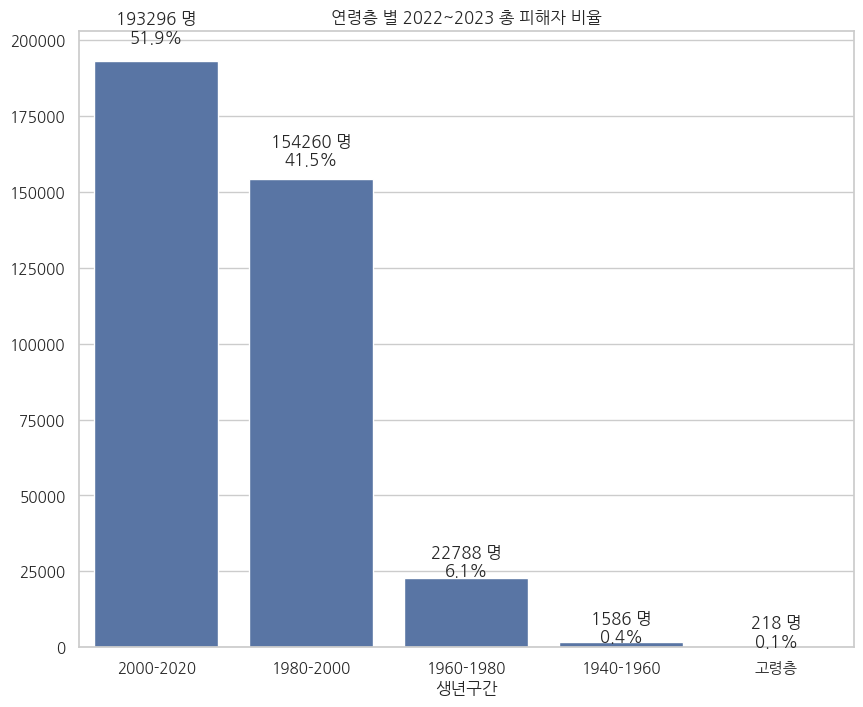

In [9]:
data = ff_victim_amount_df['생년구간'].value_counts()
total = data.sum()

plt.figure(figsize=(10, 8))
plt.title('연령층 별 2022~2023 총 피해자 비율')
ax = sns.barplot(x=data.index, y=data.values)
for p in ax.patches:
    ax.text(x = p.get_x() + p.get_width()/2, y = p.get_height() + p.get_height() * 0.03, s = f'{int(p.get_height())} 명\n{round(p.get_height()/total * 100, 1)}%', ha='center')
plt.xticks(rotation=0)
plt.show()


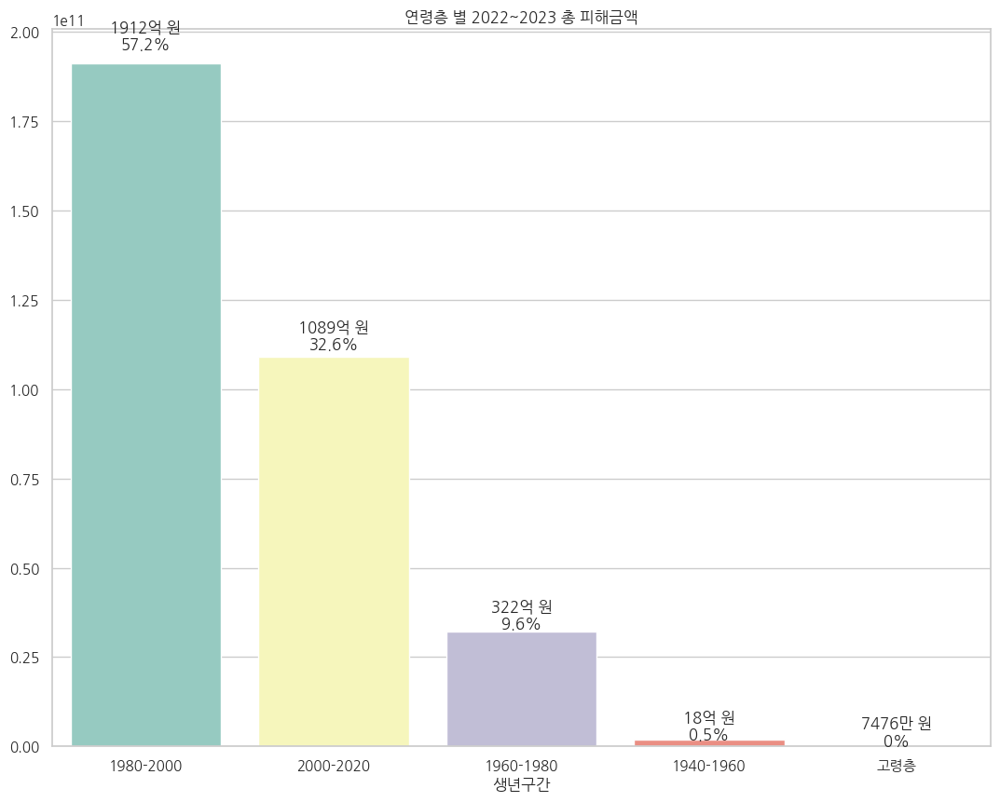

In [10]:
data = ff_victim_amount_df.groupby('생년구간')['평균금액'].sum().sort_values(ascending=False)
total = data.sum()

plt.figure(figsize=(13, 10))
plt.title('연령층 별 2022~2023 총 피해금액')
ax = sns.barplot(x=data.index, y=data.values, palette='Set3')
for p in ax.patches:
    price = amount_to_korean(int(p.get_height()))
    ax.text(x = p.get_x() + p.get_width()/2, y = p.get_height() + p.get_height() * 0.02, s = f'{price}\n{p.get_height()/total * 100:.1f}'.rstrip('0').rstrip('.') + '%', ha='center')
plt.xticks(rotation=0)
plt.show()

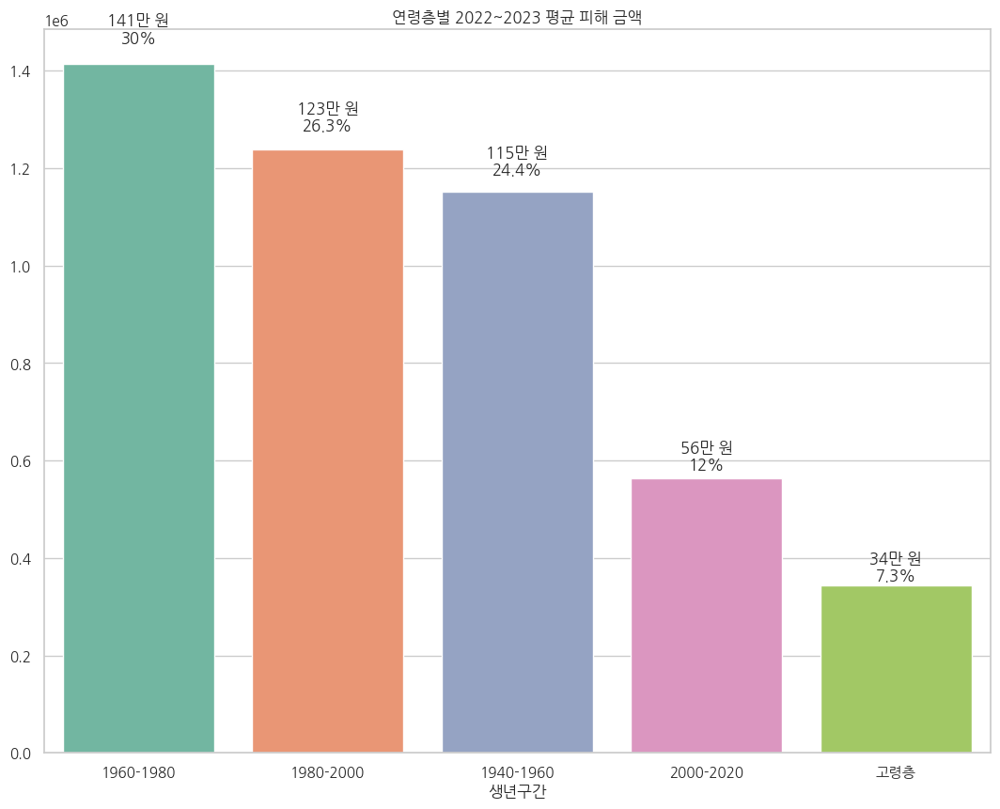

In [12]:
data = ff_victim_amount_df.groupby('생년구간')['평균금액'].mean().sort_values(ascending=False)

plt.figure(figsize=(13, 10))
plt.title('연령층별 2022~2023 평균 피해 금액')
total = data.sum()
ax = sns.barplot(x=data.index, y=data.values, palette='Set2')
for p in ax.patches:
    price = amount_to_korean(int(p.get_height()))
    ax.text(x = p.get_x() + p.get_width()/2, y = p.get_height() + p.get_height() * 0.03, s = f'{price}\n{p.get_height()/total * 100:.1f}'.rstrip('0').rstrip('.') + '%', ha='center')
plt.xticks(rotation=0)
plt.show()

## 피해 금액 분포

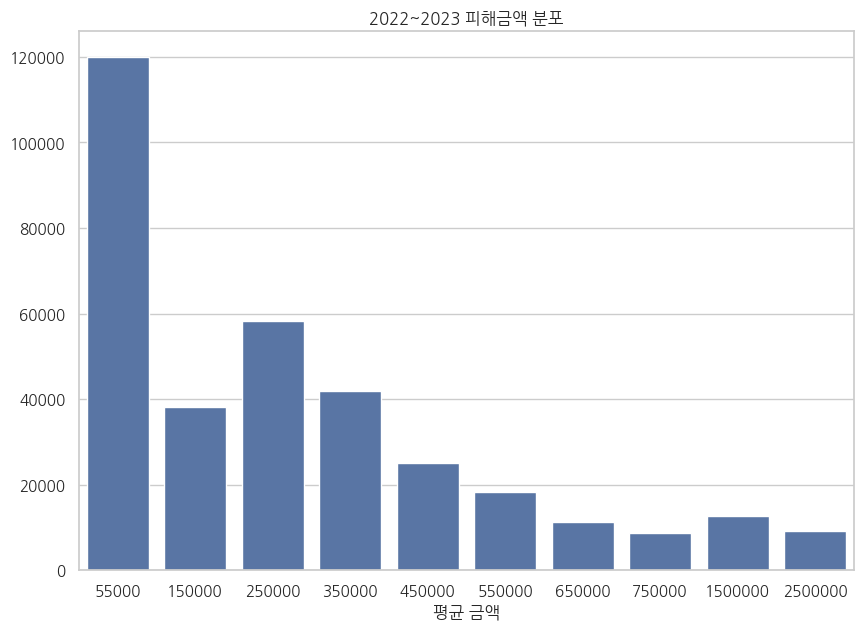

In [17]:
plt.figure(figsize=(10, 7))
data = ff_victim_amount_df['평균금액'].value_counts()[:10]

plt.title('2022~2023 피해금액 분포')
sns.barplot(x=data.index, y=data.values)
plt.xlabel('평균 금액')
plt.xticks(rotation=0)
plt.show()

## 피해 발생사이트 (연령대별)

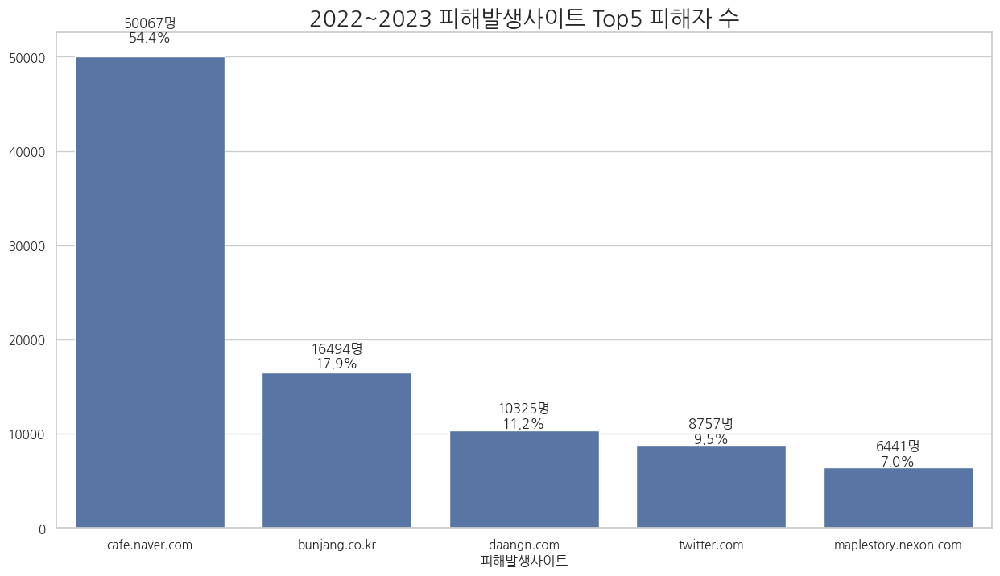

In [19]:
data = ff_site_age_df['피해발생사이트'].value_counts()[:5]
total = data.sum()

plt.figure(figsize=(15, 8))
ax = sns.barplot(x=data.index, y=data.values)

for p in ax.patches:
    ax.text(x = p.get_x() + p.get_width()/2, y = p.get_height() + p.get_height() * 0.03, s = f'{int(p.get_height())}명\n{p.get_height()/total * 100:.1f}%', ha='center')

plt.title('2022~2023 피해발생사이트 Top5 피해자 수', fontsize=20)
plt.xticks(rotation=0)
plt.show()

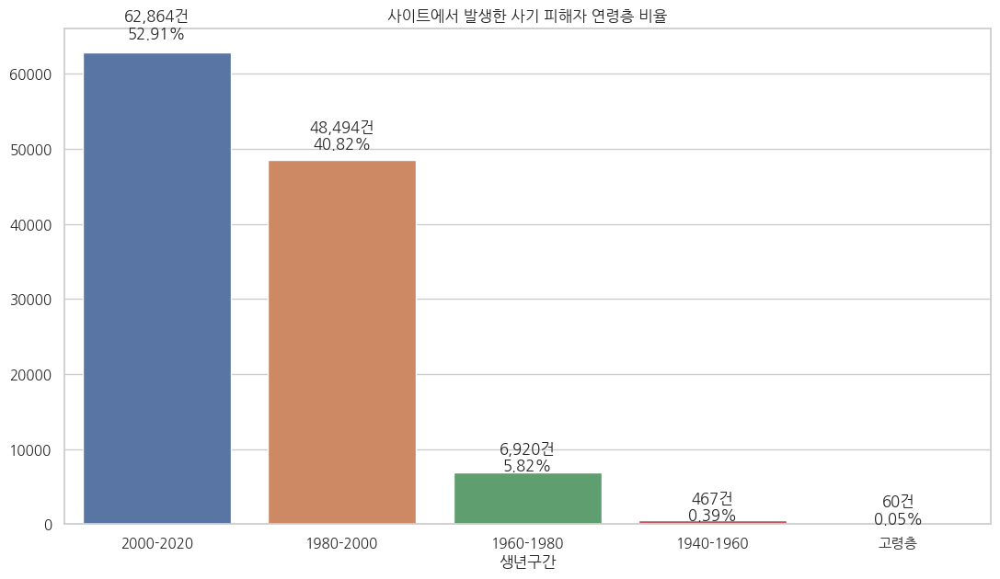

In [ ]:
data = ff_site_age_df.groupby('생년구간').size().sort_values(ascending=False)

plt.figure(figsize=(13, 7))
plt.title('사이트에서 발생한 사기 피해자 연령층 비율')
ax = sns.barplot(x=data.index, y=data.values)
total = data.sum()
for p in ax.patches:
    ax.text(x = p.get_x() + p.get_width()/2, y = p.get_height() + p.get_height() * 0.03, s = f'{int(p.get_height()):,}건\n{round(p.get_height()/total * 100, 2)}%', ha='center')

plt.xticks(rotation=0)
plt.show()

## 피해자 이용 은행 현황

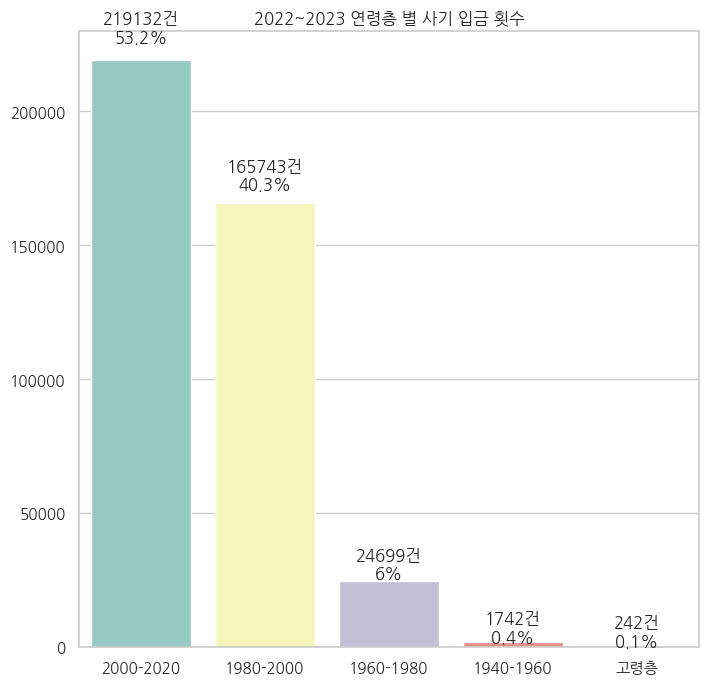

In [ ]:
data = ff_bank_age_df['생년구간'].value_counts()

total = data.sum()
plt.figure(figsize=(8, 8))
plt.title('2022~2023 연령층 별 사기 입금 횟수')
ax = sns.barplot(x=data.index, y=data.values, palette='Set3')
for p in ax.patches:
    ax.text(x = p.get_x() + p.get_width()/2, y = p.get_height() + p.get_height() * 0.03, s = f'{int(p.get_height())}건\n{p.get_height()/total * 100:.1f}'.rstrip('0').rstrip('.') + '%', ha='center')
plt.xticks(rotation=0)
plt.show()

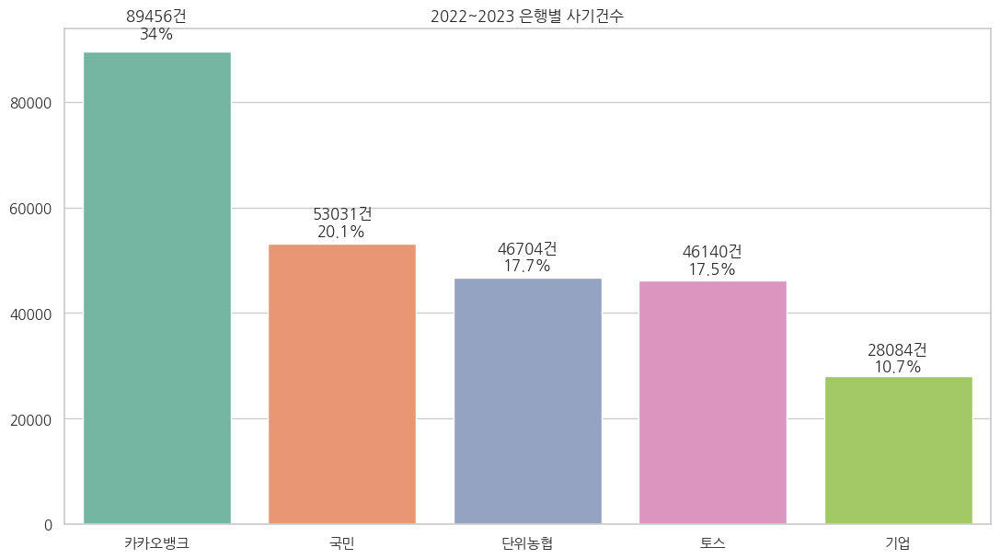

In [ ]:
data = ff_bank_sex_df['은행'].value_counts()[:5]

total = data.sum()
plt.figure(figsize=(13, 7))
plt.title('2022~2023 은행별 사기건수')
ax = sns.barplot(x=data.index, y=data.values, palette='Set2')
for p in ax.patches:
    ax.text(x = p.get_x() + p.get_width()/2, y = p.get_height() + p.get_height() * 0.03, s = f'{int(p.get_height())}건\n{p.get_height()/total * 100:.1f}'.rstrip('0').rstrip('.') + '%', ha='center')
plt.xticks(rotation=0)
plt.show()

## 피해자 이용 증권사 현황

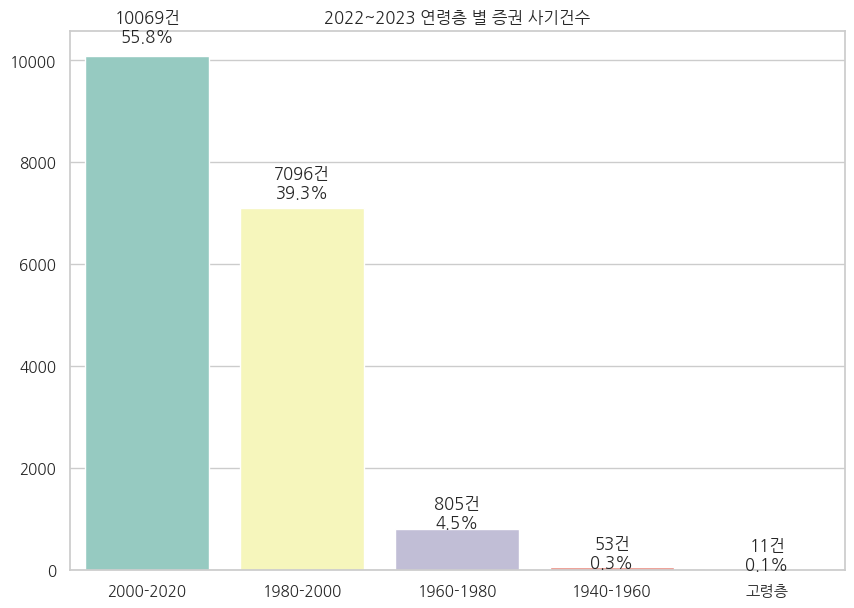

In [ ]:
data = ff_stock_age_df['생년구간'].value_counts()

total = data.sum()

plt.figure(figsize=(10, 7))
plt.title('2022~2023 연령층 별 증권 사기건수')
ax = sns.barplot(x=data.index, y=data.values, palette='Set3')
for p in ax.patches:
    ax.text(x = p.get_x() + p.get_width()/2, y = p.get_height() + p.get_height() * 0.03, s =  f'{int(p.get_height())}건\n{p.get_height()/total * 100:.1f}'.rstrip('0').rstrip('.') + '%', ha='center')

plt.xticks(rotation=0)
plt.show()

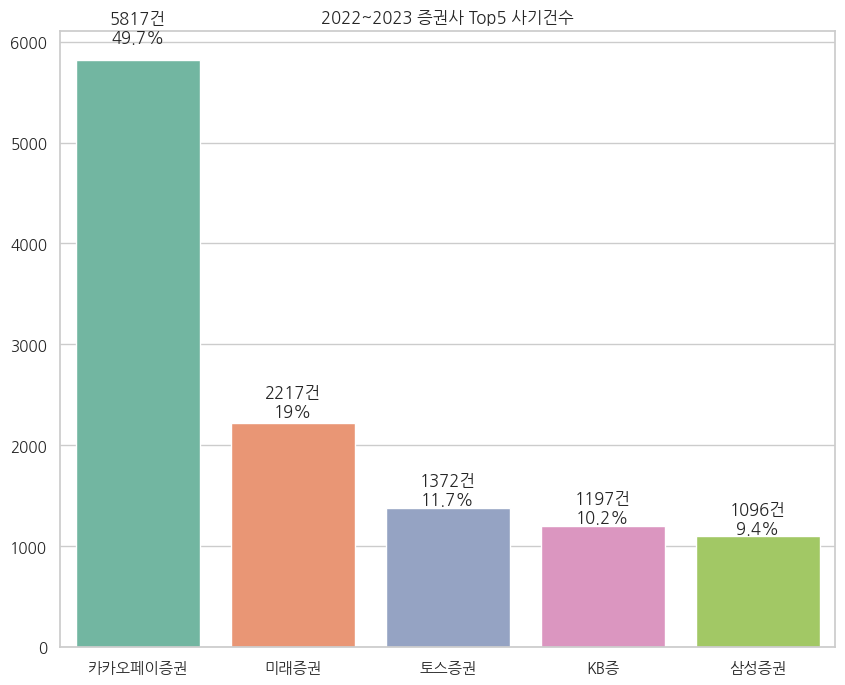

In [ ]:
data = ff_stock_sex_df['증권사'].value_counts()[:5]
total = data.sum()

plt.figure(figsize=(10, 8))
plt.title('2022~2023 증권사 Top5 사기건수')
ax = sns.barplot(x=data.index, y=data.values, palette='Set2')
for p in ax.patches:
    ax.text(x = p.get_x() + p.get_width()/2, y = p.get_height() + p.get_height() * 0.03, s =  f'{int(p.get_height())}건\n{p.get_height()/total * 100:.1f}'.rstrip('0').rstrip('.') + '%', ha='center')
plt.xticks(rotation=0)
plt.show()

## 피해 물품 데이터 현황

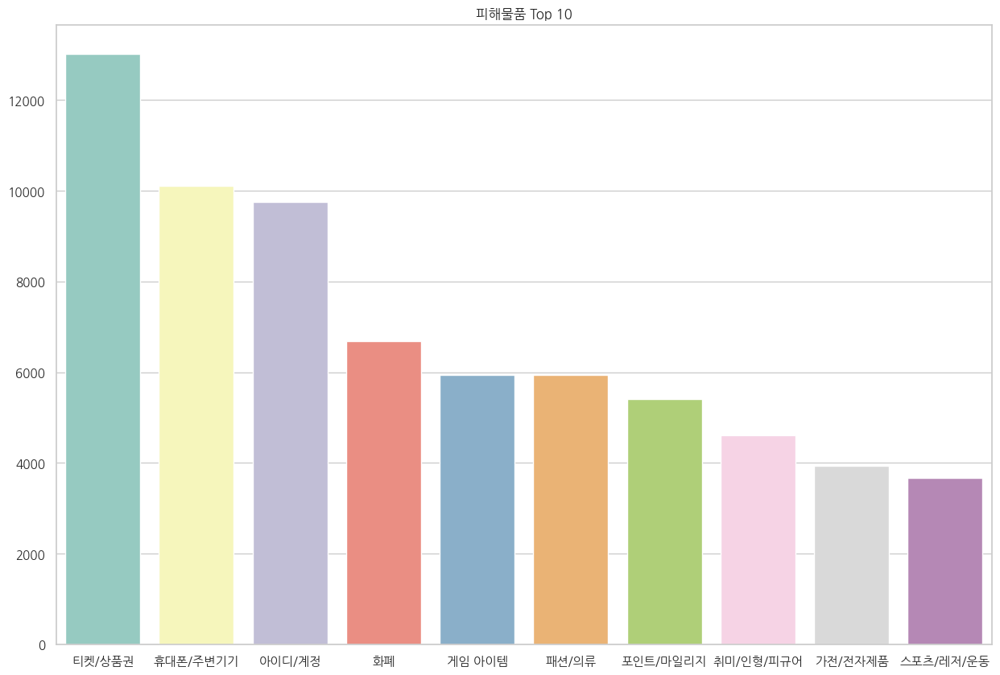

In [ ]:
data = ff_goods_df['피해물품'].value_counts()[:10]

plt.figure(figsize=(15, 10))
plt.title('피해물품 Top 10')
sns.barplot(x=data.index, y=data.values, palette='Set3')
plt.xticks(rotation=0)
plt.show()

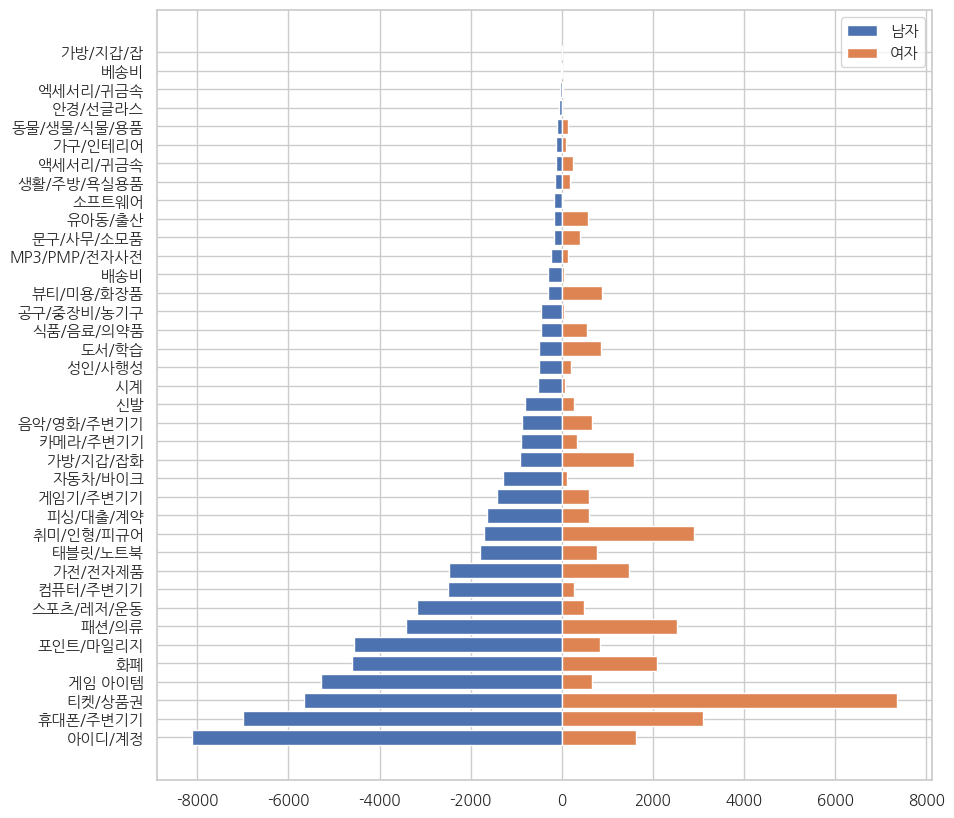

In [ ]:
men_goods = ff_goods_df.loc[ff_goods_df['성별'] == '남자'].피해물품.value_counts()
women_goods = ff_goods_df.loc[ff_goods_df['성별'] == '여자'].피해물품.value_counts()

plt.figure(figsize=(10, 10))
plt.barh(men_goods.index, -men_goods.values, label='남자')
plt.barh(women_goods.index, women_goods.values, label='여자')
plt.legend()
plt.show()

## 핀테크 피해 현황

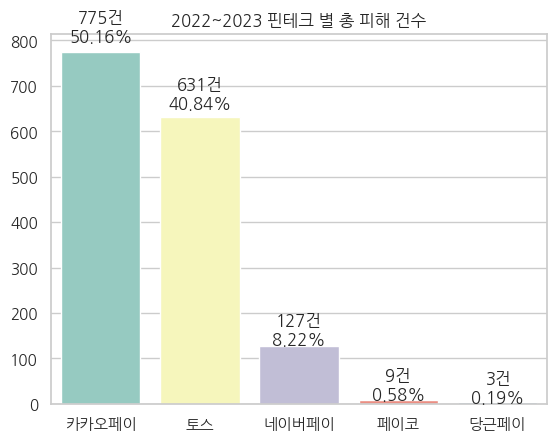

In [ ]:
data = ff_fintech['핀테크명'].value_counts()

total = data.sum()
plt.title('2022~2023 핀테크 별 총 피해 건수')
ax = sns.barplot(x=data.index, y=data.values, palette='Set3')
for p in ax.patches:
    ax.text(x = p.get_x() + p.get_width()/2, y = p.get_height() + p.get_height() * 0.03, s = f'{int(p.get_height()):,}건\n{round(p.get_height()/total * 100, 2)}%', ha='center')

plt.xticks(rotation=0)
plt.show()

## 통신 사기 피해자, 피의자의 통신사 데이터 불러오기 및 전처리

In [ ]:
mc_victim_df = load_data(glob('/content/drive/MyDrive/EDA_porj/data/금융사기 피해자/통신사/*.csv'), names=['고유번호', '자원인터넷서비스제공자', '등록일시'])
mc_victim_df['자원인터넷서비스제공자'] = mc_victim_df['자원인터넷서비스제공자'].apply(modify_mc)
mc_victim_df = mc_victim_df.sort_values(by='등록월')

mc_suspects_df = load_data(glob('/content/drive/MyDrive/EDA_porj/data/금융사기 용의자/통신사/*.csv'), names=['고유번호', '자원인터넷서비스제공자', '등록일시'])
mc_suspects_df['자원인터넷서비스제공자'] = mc_suspects_df['자원인터넷서비스제공자'].apply(modify_mc)
mc_suspects_df = mc_suspects_df.sort_values(by='등록월')

100%|██████████| 22/22 [00:06<00:00,  3.32it/s]


## 피해자, 피의자별 사용 통신사

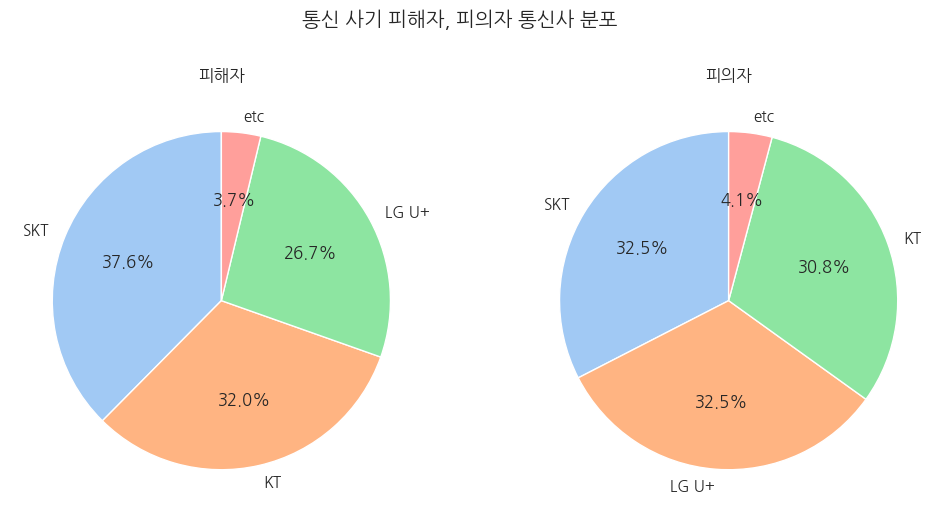

In [ ]:
labels_victims = mc_victim_df['자원인터넷서비스제공자'].value_counts().index
sizes_victims = mc_victim_df['자원인터넷서비스제공자'].value_counts().values

labels_suspects = mc_suspects_df['자원인터넷서비스제공자'].value_counts().index
sizes_suspects = mc_suspects_df['자원인터넷서비스제공자'].value_counts().values

colors = sns.color_palette("pastel")[0:len(labels_victims)]

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))
fig.suptitle('통신 사기 피해자, 피의자 통신사 분포')
axes[0].pie(sizes_victims, labels=labels_victims, autopct='%1.1f%%', startangle=90, colors=colors)
axes[0].set_title('피해자')

axes[1].pie(sizes_suspects, labels=labels_suspects, autopct='%1.1f%%', startangle=90, colors=colors)
axes[1].set_title('피의자')
plt.show()

## 2022 ~ 2023년 통신 사기건수 추이

In [ ]:
data = mc_victim_df['등록월'].value_counts(sort=False)
x = range(0, 22)
y = data.values

In [ ]:
coefficients = np.polyfit(x, y, 1)

# 추세선의 방정식: y = mx + b
m, b = coefficients

# 예측값 생성
predicted_y = np.polyval(coefficients, x)

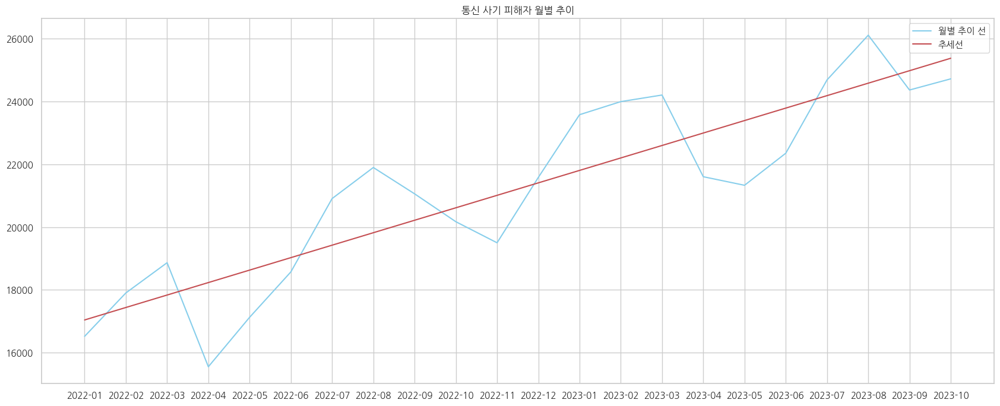

In [ ]:
fig, axes = plt.subplots(figsize=(17, 7))
axes.plot(mc_victim_df['등록월'].unique(), mc_victim_df['등록월'].value_counts(sort=False).values, color='skyblue', label='월별 추이 선')
axes.plot(predicted_y, color='r', label='추세선')
axes.set_title('통신 사기 피해자 월별 추이')
axes.legend()
axes.tick_params(axis="x", labelrotation=0)

plt.tight_layout()
plt.show()

## 월별로 데이터 프레임 만들기

In [ ]:
monthly_amount_goods = ff_goods_df.groupby('등록월')['피해물품'].size().to_frame()

In [ ]:
monthly_deposit_amount = ff_bank_sex_df.groupby('등록월').size().to_frame()
monthly_deposit_amount = monthly_deposit_amount.rename(columns={0 : '입금횟수'})

In [ ]:
monthly_occur_df = ff_num_of_occur_df.groupby('등록월')['피해발생수'].sum()[-22:].to_frame()

In [ ]:
monthly_amount_df = ff_victim_amount_df.groupby('등록월')['금액(이상)'].sum().to_frame()

In [ ]:
monthly_ff_stock_df = ff_stock_sex_df.groupby('등록월').size().to_frame()
monthly_ff_stock_df = monthly_ff_stock_df.rename(columns={0 : '증권'})

In [ ]:
monthly_ff_fintech_df = ff_fintech_df.groupby('등록월').size().to_frame()
monthly_ff_fintech_df = monthly_ff_fintech_df.rename(columns={0 : '핀테크'})

In [ ]:
monthly_ff_mc_df = mc_victim_df.groupby('등록월').size().to_frame()
monthly_ff_mc_df = monthly_ff_mc_df.rename(columns={0 : '보이스피싱'})

In [ ]:
monthly_ff_df = pd.concat([monthly_amount_df, monthly_occur_df, monthly_deposit_amount, monthly_amount_goods, monthly_ff_stock_df, monthly_ff_fintech_df, monthly_ff_mc_df], axis=1)

In [ ]:
monthly_ff_df

,금액(이상),피해발생수,입금횟수,피해물품,증권,핀테크,보이스피싱
등록월,,,,,,,
2022-01,11503740000,11364020,17614,19845,788,29,16517
2022-02,11513530000,14131328,18733,21263,791,66,17900
2022-03,14872030000,15415600,19988,22525,836,74,18864
2022-04,13354150000,11947491,16590,18555,537,75,15547
2022-05,13976540000,12927434,18095,20524,788,85,17123
2022-06,12753460000,13939853,19432,21962,879,78,18570
2022-07,14240130000,15964076,22097,24810,959,110,20908
2022-08,14938100000,18291232,23178,25963,723,101,21899
2022-09,14382340000,16636675,21929,25021,883,76,21060


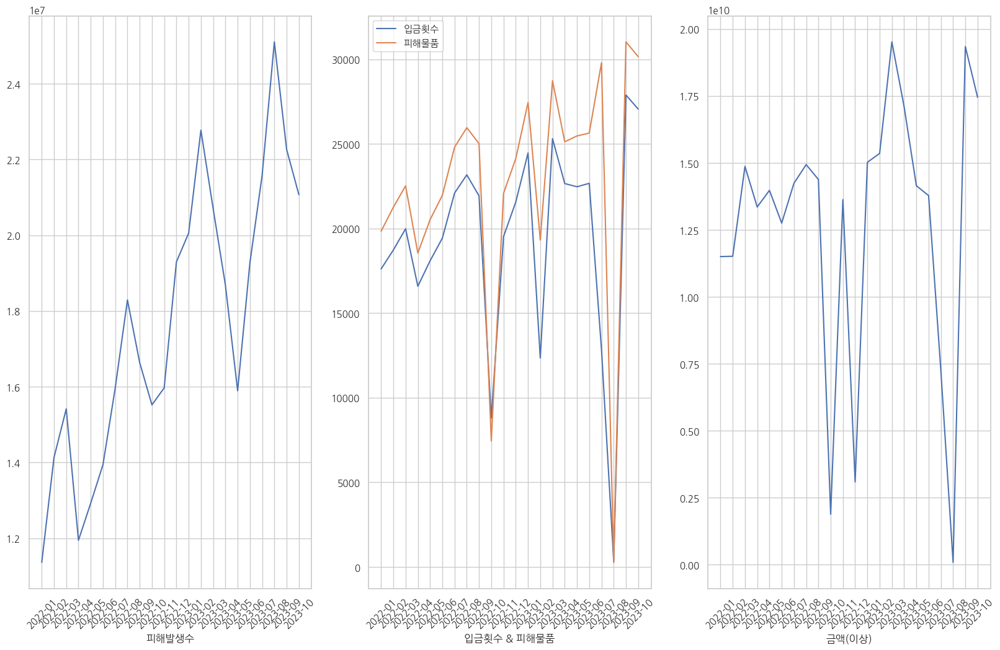

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20, 12))
axes[0].plot(monthly_ff_df['피해발생수'])
axes[0].tick_params(axis="x", labelrotation=45)
axes[0].set_xlabel('피해발생수')

axes[1].plot(monthly_ff_df['입금횟수'], label='입금횟수')
axes[1].plot(monthly_ff_df['피해물품'], label='피해물품')
axes[1].tick_params(axis="x", labelrotation=45)
axes[1].set_xlabel('입금횟수 & 피해물품')
axes[1].legend()

axes[2].plot(monthly_ff_df['금액(이상)'])
axes[2].tick_params(axis="x", labelrotation=45)
axes[2].set_xlabel('금액(이상)')

plt.show()

## 피의자 데이터 전처리

In [ ]:
# 성별 피의자 데이터
fs_sex_df = load_data(glob('/content/drive/MyDrive/EDA_porj/data/금융사기 용의자/성별/*.csv'), names=['고유번호', '성별', '광역도시명', '법정시군구명', '등록일시'])
fs_sex_df['광역도시명'] = fs_sex_df['광역도시명'].apply(modify_city)

# 연령대 피의자 데이터
fs_age_df = load_data(glob('/content/drive/MyDrive/EDA_porj/data/금융사기 용의자/연령대/*.csv'), names=['고유번호', '생년구간', '광역도시명', '법정시군구명', '등록일시'])
fs_age_df['광역도시명'] = fs_age_df['광역도시명'].apply(modify_city)
fs_age_df = modify_age_section(fs_age_df)

# 지역별 피의자 데이터
fs_region_df = load_data(glob('/content/drive/MyDrive/EDA_porj/data/금융사기 용의자/지역/*.csv'), names=['고유번호', '광역도시명', '법정시군구명', '등록일시'])
fs_region_df['광역도시명'] = fs_region_df['광역도시명'].apply(modify_city)

100%|██████████| 22/22 [00:00<00:00, 25.00it/s]


## 피의자 성별 비율

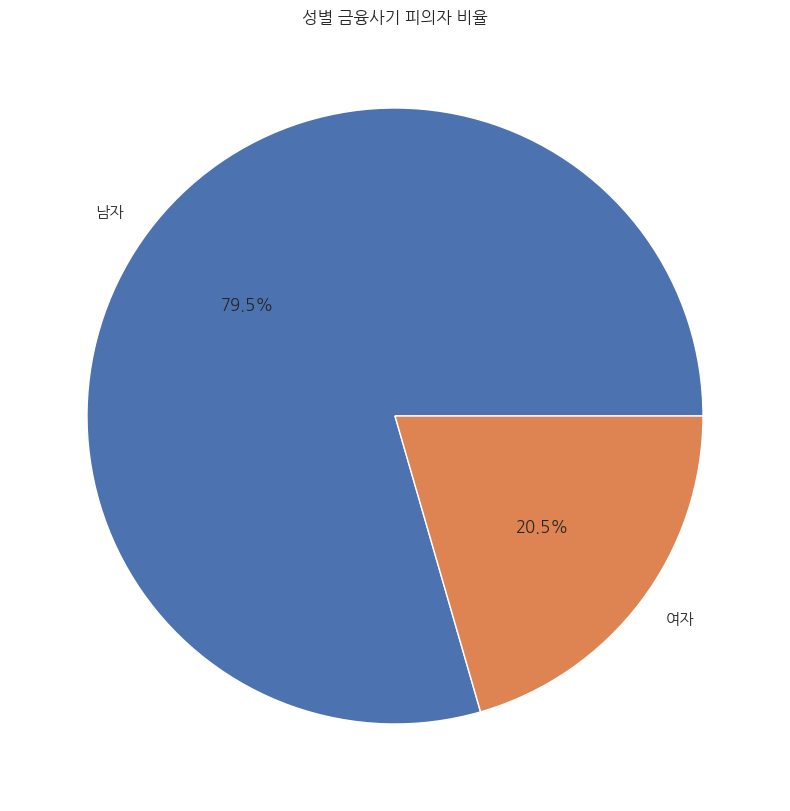

In [ ]:
plt.title('성별 금융사기 피의자 비율')
fs_sex_df['성별'].value_counts().plot(kind='pie', autopct='%1.1f%%', figsize=(10, 10))
plt.ylabel('')
plt.show()

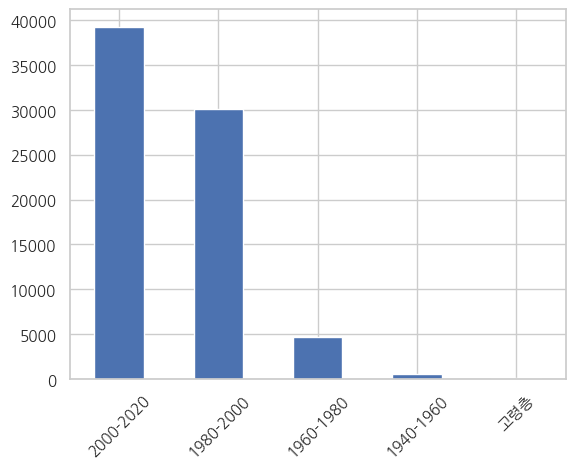

In [ ]:
fs_age_df['생년구간'].value_counts().plot(kind='bar')
plt.xticks(rotation=45)
plt.show()

### 금융사기 총 발생건수 추이: 2022년 1월 ~ 2023년 10월

In [2]:
path = './data/금융사기 피해자/발생건수/'
file_list = os.listdir(path)

file_list_py_07 = [file for file in file_list if file.startswith('TCH_07')]
file_list_py_07

['TCH_07_20220131_C_001.csv',
 'TCH_07_20220228_C_001.csv',
 'TCH_07_20220331_C_001.csv',
 'TCH_07_20220430_C_001.csv',
 'TCH_07_20220531_C_001.csv',
 'TCH_07_20220630_C_001.csv',
 'TCH_07_20220731_C_001.csv',
 'TCH_07_20220831_C_001.csv',
 'TCH_07_20220930_C_001.csv',
 'TCH_07_20221031_C_001.csv',
 'TCH_07_20221130_C_001.csv',
 'TCH_07_20221231_C_001.csv',
 'TCH_07_20230131_C_001.csv',
 'TCH_07_20230228_C_001.csv',
 'TCH_07_20230331_C_001.csv',
 'TCH_07_20230430_C_001.csv',
 'TCH_07_20230531_C_001.csv',
 'TCH_07_20230630_C_001.csv',
 'TCH_07_20230731_C_001.csv',
 'TCH_07_20230831_C_001.csv',
 'TCH_07_20230930_C_001.csv',
 'TCH_07_20231031_C_001.csv']

In [3]:
df_gen = pd.DataFrame()

for i in file_list_py_07:
    data = pd.read_csv(path + i, header = None)
    df_gen = pd.concat([df_gen,data])

df_gen = df_gen.reset_index(drop = True)

df_gen

,0,1,2
0,1332059,20220101000405020210,422
1,1332060,20220101000857036969,422
2,1332061,20220101001221040452,422
3,1332062,20220101001913043412,422
4,1332063,20220101003043047022,422
...,...,...,...
492451,1843525,20231030234247010318,850
492452,1843526,20231030234903013739,850
492453,1843527,20231030235208017678,850
492454,1843528,20231030235213026268,850


In [4]:
df_gen.columns = ['ID', '등록일시', '피해발생수']
df_gen

,ID,등록일시,피해발생수
0,1332059,20220101000405020210,422
1,1332060,20220101000857036969,422
2,1332061,20220101001221040452,422
3,1332062,20220101001913043412,422
4,1332063,20220101003043047022,422
...,...,...,...
492451,1843525,20231030234247010318,850
492452,1843526,20231030234903013739,850
492453,1843527,20231030235208017678,850
492454,1843528,20231030235213026268,850


In [5]:
print(df_gen.drop(columns = 'ID', axis = 1))
df_gen.drop(columns = 'ID', axis = 1, inplace = True)

                        등록일시  피해발생수
0       20220101000405020210    422
1       20220101000857036969    422
2       20220101001221040452    422
3       20220101001913043412    422
4       20220101003043047022    422
...                      ...    ...
492451  20231030234247010318    850
492452  20231030234903013739    850
492453  20231030235208017678    850
492454  20231030235213026268    850
492455  20231030235237035861    850

[492456 rows x 2 columns]


In [6]:
df_gen

,등록일시,피해발생수
0,20220101000405020210,422
1,20220101000857036969,422
2,20220101001221040452,422
3,20220101001913043412,422
4,20220101003043047022,422
...,...,...
492451,20231030234247010318,850
492452,20231030234903013739,850
492453,20231030235208017678,850
492454,20231030235213026268,850


In [7]:
df_gen = df_gen.sort_values('등록일시')
df_gen['년월'] = df_gen['등록일시'].str[0:6]
df_gen['일'] = df_gen['등록일시'].str[6:8]

df_gen

,등록일시,피해발생수,년월,일
319,20220101000301170634,422,202201,01
0,20220101000405020210,422,202201,01
275,20220101000659988625,422,202201,01
199,20220101000727544725,422,202201,01
1,20220101000857036969,422,202201,01
...,...,...,...,...
492454,20231030235213026268,850,202310,30
492455,20231030235237035861,850,202310,30
492097,20231030235440946552,850,202310,30
492002,20231030235516284689,850,202310,30


In [8]:
df_gen.isnull().sum()

등록일시     0
피해발생수    0
년월       0
일        0
dtype: int64

In [9]:
df_gen

,등록일시,피해발생수,년월,일
319,20220101000301170634,422,202201,01
0,20220101000405020210,422,202201,01
275,20220101000659988625,422,202201,01
199,20220101000727544725,422,202201,01
1,20220101000857036969,422,202201,01
...,...,...,...,...
492454,20231030235213026268,850,202310,30
492455,20231030235237035861,850,202310,30
492097,20231030235440946552,850,202310,30
492002,20231030235516284689,850,202310,30


In [10]:
df_gen_month = df_gen.groupby(['년월'])['피해발생수'].mean()
df_gen_month

년월
202201    616.403775
202202    719.590997
202203    715.939067
202204    644.243246
202205    655.416447
202206    700.108131
202207    748.713817
202208    792.033948
202209    768.899339
202210    734.728852
202211    740.356236
202212    812.961237
202301    831.062238
202302    931.401701
202303    883.051442
202304    812.942141
202305    747.705617
202306    825.001628
202307    871.773370
202308    905.795771
202309    885.341762
202310    844.712831
Name: 피해발생수, dtype: float64

In [11]:
df_gen_month = pd.DataFrame(df_gen_month)
df_gen_month

,피해발생수
년월,
202201,616.403775
202202,719.590997
202203,715.939067
202204,644.243246
202205,655.416447
202206,700.108131
202207,748.713817
202208,792.033948
202209,768.899339


In [14]:
df_gen_month['기간'] = range(1,23)
df_gen_month = pd.DataFrame(df_gen_month)

df_gen_month

,피해발생수,기간
년월,,
202201,616.403775,1
202202,719.590997,2
202203,715.939067,3
202204,644.243246,4
202205,655.416447,5
202206,700.108131,6
202207,748.713817,7
202208,792.033948,8
202209,768.899339,9


In [15]:
df_gen_month.set_index('피해발생수',inplace=True)
df_gen_month = df_gen_month.astype('int')
df_gen_month.reset_index(inplace=True)
df_gen_month

,피해발생수,기간
0,616.403775,1
1,719.590997,2
2,715.939067,3
3,644.243246,4
4,655.416447,5
5,700.108131,6
6,748.713817,7
7,792.033948,8
8,768.899339,9
9,734.728852,10


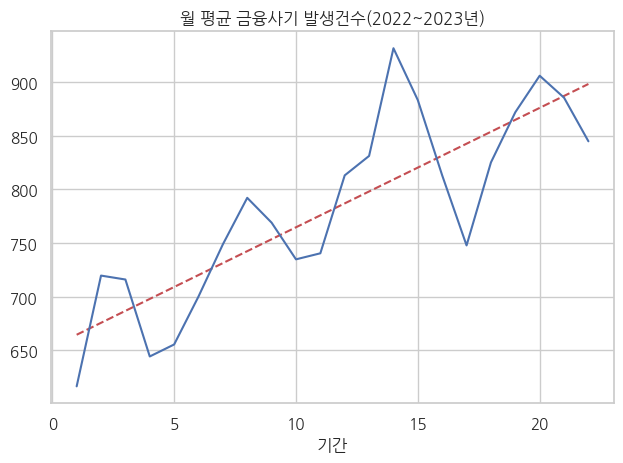

In [17]:
plt.plot(figsize = (5, 4))

x = df_gen_month['기간']
y = df_gen_month['피해발생수']
z = np.polyfit(x,y,1) # numpy의 커브 피팅 기능 사용 (1차 함수)
p = np.poly1d(z) # 1차 함수 그리기 위한 객체 만들기

plt.plot(x,p(x),"r--") # 추세선 그리기
plt.plot(x,y)

plt.title("월 평균 금융사기 발생건수(2022~2023년)")
plt.xlabel('기간')

plt.tight_layout()
plt.show()

### 지역별 / 연령대별 / 피해금액별 데이터셋 EDA

In [32]:
path = './data/금융사기 피해자/발생건수/'

file_list_py_18 = [f"금융사기 피해자/연령대/{x}" for x in os.listdir("./data/금융사기 피해자/연령대")] #연령대별
file_list_py_36 = [f"금융사기 피해자/성별/{x}" for x in os.listdir("./data/금융사기 피해자/성별")] #성별
file_list_py_38 = [f"금융사기 피해자/지역/{x}" for x in os.listdir("./data/금융사기 피해자/지역")] #금액별

In [36]:
path = './data/'

In [37]:
df_amt = pd.DataFrame()

for i in file_list_py_18:
    data = pd.read_csv(path + i, header = None)
    df_amt = pd.concat([df_amt,data])

df_amt = df_amt.reset_index(drop = True)

df_amt

,0,1,2,3
0,181420,1970-1980,500000-600000,20220110130819156768
1,181421,1970-1980,500000-600000,20220107085155166069
2,181422,1970-1980,500000-600000,20220107085155170320
3,181423,1970-1980,500000-600000,20220103125823175848
4,181424,1940-1950,500000-600000,20220103135412180752
...,...,...,...,...
372203,577005,1970-1980,200000-300000,20231031144519471513
372204,577006,1970-1980,200000-300000,20231031144519476217
372205,577007,1970-1980,300000-400000,20231031160907481945
372206,577008,2000-2010,200000-300000,20231031233018489042


In [38]:
df_sex = pd.DataFrame()

for i in file_list_py_36:
    data = pd.read_csv(path + i, header = None)
    df_sex = pd.concat([df_sex,data])

df_sex = df_sex.reset_index(drop = True)

df_sex

,0,1,2,3,4
0,1,남자,경기도,남양주시,20220101002831359812
1,2,여자,부산광역시,남구,20220101012043374743
2,3,남자,서울특별시,송파구,20220101025813388617
3,4,남자,충청남도,아산시,20220101092456401307
4,5,남자,충청남도,아산시,20220101093359406904
...,...,...,...,...,...
448590,448591,남자,광주광역시,북구,20231031231950507441
448591,448592,남자,서울특별시,동대문구,20231031232304513098
448592,448593,남자,충청남도,천안시동남구,20231031232501518729
448593,448594,남자,광주광역시,서구,20231031234103524528


In [39]:
df_age = pd.DataFrame()

for i in file_list_py_38:
    data = pd.read_csv(path + i, header = None)
    df_age = pd.concat([df_age,data])

df_age = df_age.reset_index(drop = True)

df_age

,0,1,2,3,4
0,1,1990-2000,광주광역시,북구,20220101000857119050
1,2,1980-1990,서울특별시,중구,20220101020949134329
2,3,2000-2010,부산광역시,금정구,20220101054438147779
3,4,2000-2010,부산광역시,금정구,20220101054438154673
4,5,2000-2010,경상북도,포항시남구,20220101100319169895
...,...,...,...,...,...
451788,451789,2010-2020,광주광역시,북구,20231031231950505460
451789,451790,2010-2020,서울특별시,동대문구,20231031232304512820
451790,451791,1980-1990,충청남도,천안시동남구,20231031232501521198
451791,451792,2010-2020,광주광역시,서구,20231031234103527149


In [40]:
df_amt.columns = ['ID', '생년구간', '금액구간', '등록일시']
df_sex.columns = ['ID', '성별', '광역시도명', '법정시군구', '등록일시']
df_age.columns = ['ID', '생년구간', '광역시도명', '법정시군구', '등록일시']

In [41]:
df_amt
df_sex
df_age

,ID,생년구간,광역시도명,법정시군구,등록일시
0,1,1990-2000,광주광역시,북구,20220101000857119050
1,2,1980-1990,서울특별시,중구,20220101020949134329
2,3,2000-2010,부산광역시,금정구,20220101054438147779
3,4,2000-2010,부산광역시,금정구,20220101054438154673
4,5,2000-2010,경상북도,포항시남구,20220101100319169895
...,...,...,...,...,...
451788,451789,2010-2020,광주광역시,북구,20231031231950505460
451789,451790,2010-2020,서울특별시,동대문구,20231031232304512820
451790,451791,1980-1990,충청남도,천안시동남구,20231031232501521198
451791,451792,2010-2020,광주광역시,서구,20231031234103527149


In [42]:
df_amt.drop(columns = 'ID', axis = 1, inplace = True)
df_sex.drop(columns = 'ID', axis = 1, inplace = True)
df_age.drop(columns = 'ID', axis = 1, inplace = True)

In [43]:
df_amt = df_amt.sort_values('등록일시')
df_sex = df_sex.sort_values('등록일시')
df_age = df_age.sort_values('등록일시')

In [44]:
df_amt
df_sex
df_age

,생년구간,광역시도명,법정시군구,등록일시
19964,2010-2020,부산광역시,금정구,20220101000301547041
17743,1980-1990,제주특별자치도,서귀포시,20220101000405617475
1736,1980-1990,대구광역시,북구,20220101000659966130
1555,2000-2010,경기도,남양주시,20220101000727580838
1556,2000-2010,경기도,남양주시,20220101000727593818
...,...,...,...,...
451792,2010-2020,광주광역시,서구,20231031234403532838
446905,2000-2010,부산광역시,남구,20231031234453887005
442907,1990-2000,인천광역시,계양구,20231031235154932113
440905,1990-2000,서울특별시,관악구,20231031235454111073


In [45]:
df_amt['년월'] = df_amt['등록일시'].str[0:6]
df_amt['일'] = df_amt['등록일시'].str[6:8]

df_sex['년월'] = df_sex['등록일시'].str[0:6]
df_sex['일'] = df_sex['등록일시'].str[6:8]

df_age['년월'] = df_age['등록일시'].str[0:6]
df_age['일'] = df_age['등록일시'].str[6:8]

In [46]:
df_amt

,생년구간,금액구간,등록일시,년월,일
10108,1980-1990,10000-100000,20220101000405520700,202201,01
4499,2000-2010,10000-100000,20220101000727480778,202201,01
4500,2000-2010,10000-100000,20220101000727486047,202201,01
7048,1990-2000,20000000-30000000,20220101000857158777,202201,01
4380,2000-2010,100000-200000,20220101001050809760,202201,01
...,...,...,...,...,...
364223,2000-2010,10000-100000,20231031235426841890,202310,31
352793,1990-2000,400000-500000,20231031235454840852,202310,31
354282,2000-2010,10000-100000,20231031235539686708,202310,31
364224,2010-2020,10000-100000,20231031235555850608,202310,31


In [47]:
df_sex

,성별,광역시도명,법정시군구,등록일시,년월,일
4691,남자,부산광역시,금정구,20220101000301995033,202201,01
14137,여자,제주특별자치도,서귀포시,20220101000405491234,202201,01
1446,남자,대구광역시,북구,20220101000659662422,202201,01
1359,여자,경기도,남양주시,20220101000727284346,202201,01
1360,여자,경기도,남양주시,20220101000727292675,202201,01
...,...,...,...,...,...,...
448594,남자,광주광역시,서구,20231031234403529874,202310,31
443707,여자,부산광역시,남구,20231031234453890839,202310,31
439709,여자,인천광역시,계양구,20231031235154931854,202310,31
437707,남자,서울특별시,관악구,20231031235454098182,202310,31


In [48]:
df_age

,생년구간,광역시도명,법정시군구,등록일시,년월,일
19964,2010-2020,부산광역시,금정구,20220101000301547041,202201,01
17743,1980-1990,제주특별자치도,서귀포시,20220101000405617475,202201,01
1736,1980-1990,대구광역시,북구,20220101000659966130,202201,01
1555,2000-2010,경기도,남양주시,20220101000727580838,202201,01
1556,2000-2010,경기도,남양주시,20220101000727593818,202201,01
...,...,...,...,...,...,...
451792,2010-2020,광주광역시,서구,20231031234403532838,202310,31
446905,2000-2010,부산광역시,남구,20231031234453887005,202310,31
442907,1990-2000,인천광역시,계양구,20231031235154932113,202310,31
440905,1990-2000,서울특별시,관악구,20231031235454111073,202310,31


In [49]:
df_amt.groupby(['년월', '금액구간'])['생년구간'].count()
df_amt.groupby(['년월', '생년구간'])['금액구간'].count()
df_amt.groupby(['년월', '생년구간', '금액구간'])['생년구간'].count()
df_amt.groupby(['년월', '생년구간', '금액구간'])['금액구간'].count()

년월      생년구간       금액구간           
202201  1900-1910  100000-200000       1
                   400000-500000       1
        1910-1920  10000-100000        2
                   200000-300000       2
        1940-1950  10000-100000        6
                                      ..
202310  2010-2020  600000-700000      42
                   700000-800000      22
                   7000000-8000000     1
                   800000-900000      31
                   900000-1000000      5
Name: 금액구간, Length: 3515, dtype: int64

In [50]:
df_sex.groupby(['년월', '광역시도명'])['성별'].count()
df_sex.groupby(['년월', '성별'])['광역시도명'].count()
df_sex.groupby(['년월', '성별', '광역시도명'])['성별'].count()
df_sex.groupby(['년월', '성별', '광역시도명'])['광역시도명'].count()

년월      성별  광역시도명          
202201  남자  Alabama              1
            Bangkok              2
            BritishColumbia      1
            California           1
            CanTho               6
                              ... 
202310  여자  전라남도                72
            전라북도                56
            제주특별자치도             27
            충청남도               124
            충청북도                91
Name: 광역시도명, Length: 1363, dtype: int64

In [51]:
df_age.groupby(['년월', '광역시도명'])['생년구간'].count()
df_age.groupby(['년월', '생년구간'])['광역시도명'].count()
df_age.groupby(['년월', '생년구간', '광역시도명'])['생년구간'].count()
df_age.groupby(['년월', '생년구간', '광역시도명'])['광역시도명'].count()

년월      생년구간       광역시도명  
202201  1900-1910  경기도         1
                   인천광역시       1
        1910-1920  경기도         3
                   경상남도        2
                   경상북도        2
                              ..
202310  2010-2020  전라남도       48
                   전라북도       45
                   제주특별자치도    19
                   충청남도       50
                   충청북도       30
Name: 광역시도명, Length: 3335, dtype: int64

### 월별 피해 연령대 추이 확인

In [52]:
df_amt_filt = pd.DataFrame(df_amt.groupby(['년월', '생년구간', '금액구간'])['생년구간'].count())
df_amt_filt

생년구간
년월     생년구간      금액구간                 
202201 1900-1910 100000-200000       1
                 400000-500000       1
       1910-1920 10000-100000        2
                 200000-300000       2
       1940-1950 10000-100000        6
...                                ...
202310 2010-2020 600000-700000      42
                 700000-800000      22
                 7000000-8000000     1
                 800000-900000      31
                 900000-1000000      5

[3515 rows x 1 columns]

In [53]:
df_amt[df_amt['생년구간'] == '2010-2020'][['금액구간', '년월']]

,금액구간,년월
10113,10000-100000,202201
10090,10000-100000,202201
10125,10000-100000,202201
10138,10000-100000,202201
7035,10000-100000,202201
...,...,...
360740,400000-500000,202310
360742,10000-100000,202310
357133,10000-100000,202310
372207,10000-100000,202310


In [54]:
df_amt.groupby(['생년구간', '년월'])['생년구간'].count()
df_amt.groupby('생년구간')['생년구간'].count() # 이상치 제거: 2070년대 이후 출생자 제거
df_amt.drop(df_amt[(df_amt['생년구간'] == '2070-2080') | (df_amt['생년구간'] == '2080-2090')].index, axis = 0, inplace = True)
df_amt.groupby('생년구간')['생년구간'].count()

생년구간
1900-1910        78
1910-1920        94
1920-1930         1
1930-1940        45
1940-1950       354
1950-1960      1234
1960-1970      4736
1970-1980     18054
1980-1990     53508
1990-2000    100776
2000-2010    147106
2010-2020     46219
Name: 생년구간, dtype: int64

In [55]:
df_amt.loc[df_amt['생년구간'] == '1900-1910', '생년구간'] = '고령층'
df_amt.loc[df_amt['생년구간'] == '1910-1920', '생년구간'] = '고령층'
df_amt.loc[df_amt['생년구간'] == '1920-1930', '생년구간'] = '고령층'
df_amt.loc[df_amt['생년구간'] == '1930-1940', '생년구간'] = '고령층'
df_amt[df_amt['생년구간'] == '고령층']

df_amt.loc[df_amt['생년구간'] == '1940-1950', '생년구간'] = '1940-1960'
df_amt.loc[df_amt['생년구간'] == '1950-1960', '생년구간'] = '1940-1960'

df_amt.loc[df_amt['생년구간'] == '1960-1970', '생년구간'] = '1960-1980'
df_amt.loc[df_amt['생년구간'] == '1970-1980', '생년구간'] = '1960-1980'

df_amt.loc[df_amt['생년구간'] == '1980-1990', '생년구간'] = '1980-2000'
df_amt.loc[df_amt['생년구간'] == '1990-2000', '생년구간'] = '1980-2000'

df_amt.loc[df_amt['생년구간'] == '2000-2010', '생년구간'] = '2000-2020'
df_amt.loc[df_amt['생년구간'] == '2010-2020', '생년구간'] = '2000-2020'

In [56]:
data = df_amt.groupby(['년월', '생년구간'])['금액구간'].count().unstack()
data.fillna(0, inplace = True)
data

생년구간,1940-1960,1960-1980,1980-2000,2000-2020,고령층
년월,,,,,
202201,72.0,1133.0,7165.0,7747.0,6.0
202202,83.0,1014.0,7191.0,8890.0,12.0
202203,67.0,1117.0,8757.0,8487.0,8.0
202204,95.0,1050.0,6909.0,6992.0,10.0
202205,101.0,1203.0,7363.0,8007.0,11.0
202206,100.0,1237.0,7698.0,8906.0,16.0
202207,106.0,1341.0,8252.0,10656.0,8.0
202208,109.0,1413.0,8507.0,10946.0,7.0
202209,78.0,1525.0,7937.0,10467.0,18.0


In [57]:
df_amt.groupby(['년월'])['금액구간'].count()/30

년월
202201    537.433333
202202    573.000000
202203    614.533333
202204    501.866667
202205    556.166667
202206    598.566667
202207    678.766667
202208    699.400000
202209    667.500000
202210    111.433333
202211    603.233333
202212    160.466667
202301    761.400000
202302    565.833333
202303    794.466667
202304    711.000000
202305    701.433333
202306    701.933333
202307    426.866667
202308      6.666667
202309    740.466667
202310    694.400000
Name: 금액구간, dtype: float64

In [58]:
plt.rc('font', family='NanumBarunGothic')

"""
!sudo apt-get install -y fonts-nanum
!sudo fc-cache -fv
!rm ~/.cache/matplotlib -rf
"""

'\n!sudo apt-get install -y fonts-nanum\n!sudo fc-cache -fv\n!rm ~/.cache/matplotlib -rf\n'

In [ ]:
data.plot(rot=0, figsize = (15, 6))
plt.title("Monthly trend of damage amount by age")
plt.xlabel("기간")
plt.ylabel("피해 발생건수")
plt.ylim(0, 15000)
plt.show()

In [60]:
a = df_amt.groupby('생년구간')['일'].count()/df_amt.groupby('생년구간')['일'].count().sum()*100

In [ ]:
lb = ['1940-1960','1960-1980', '1980-2000', '2000-2020', '고령층 ']
exp = [0.2, 0.05, 0.05, 0.05, 0.08]

plt.figure(figsize = (10, 10))
plt.pie(a, autopct='%.1f%%', explode = exp, labeldistance=2)
plt.legend(lb, loc = 'upper right')

plt.title("연령대별 금융사기 피해 발생비율")

In [ ]:
data_age_sort = data.iloc[:,1:4]

data_age_sort.plot.bar(rot=0, figsize = (14, 6))

plt.title("주요 연령대 피해 발생건수")
plt.xlabel("기간")
plt.ylabel("피해 발생건수")
plt.ylim(0, 14000)

plt.tight_layout()

plt.show()

# 총 피해 발생건수랑 비교해서 겹쳐 그리기

### df_amt: 월별 피해 금액 추이 확인

In [63]:
df_amt.groupby(['년월'])['금액구간'].count()

년월
202201    16123
202202    17190
202203    18436
202204    15056
202205    16685
202206    17957
202207    20363
202208    20982
202209    20025
202210     3343
202211    18097
202212     4814
202301    22842
202302    16975
202303    23834
202304    21330
202305    21043
202306    21058
202307    12806
202308      200
202309    22214
202310    20832
Name: 금액구간, dtype: int64

In [64]:
df_amt.groupby(['년월', '금액구간', '생년구간'])['금액구간'].count()
df_amt[df_amt['금액구간'] == '900000-1000000'].groupby(['년월', '금액구간', '생년구간'])['금액구간'].count() # 고액 피해

년월      금액구간            생년구간     
202201  900000-1000000  1940-1960      1
                        1960-1980     14
                        1980-2000     74
                        2000-2020     60
202202  900000-1000000  1940-1960      5
                                    ... 
202309  900000-1000000  고령층            1
202310  900000-1000000  1940-1960      2
                        1960-1980     12
                        1980-2000    110
                        2000-2020     98
Name: 금액구간, Length: 78, dtype: int64

In [66]:
df_amt

,생년구간,금액구간,등록일시,년월,일
10108,1980-2000,10000-100000,20220101000405520700,202201,01
4499,2000-2020,10000-100000,20220101000727480778,202201,01
4500,2000-2020,10000-100000,20220101000727486047,202201,01
7048,1980-2000,20000000-30000000,20220101000857158777,202201,01
4380,2000-2020,100000-200000,20220101001050809760,202201,01
...,...,...,...,...,...
364223,2000-2020,10000-100000,20231031235426841890,202310,31
352793,1980-2000,400000-500000,20231031235454840852,202310,31
354282,2000-2020,10000-100000,20231031235539686708,202310,31
364224,2000-2020,10000-100000,20231031235555850608,202310,31


In [73]:
# df_amt.groupby('금액구간')['년월', '생년구간'].count()
df_amt.sort_values('금액구간').groupby('금액구간')['생년구간'].count() # 금액구간 확인

금액구간
0-100000                    9
0-1000000                  14
10000-100000           120003
100000-200000           38066
1000000-1100000          1704
1000000-2000000         12703
10000000-11000000         174
10000000-20000000        1512
100000000-110000000        54
200000-300000           58377
2000000-3000000          9150
20000000-30000000        1220
300000-400000           41805
3000000-4000000          3997
30000000-40000000         656
400000-500000           25100
4000000-5000000          2186
40000000-50000000         344
500000-600000           18274
5000000-6000000          1678
50000000-60000000         320
600000-700000           11355
6000000-7000000          1100
60000000-70000000         137
700000-800000            8820
7000000-8000000           784
70000000-80000000         130
800000-900000            6621
8000000-9000000           643
80000000-90000000          84
900000-1000000           4695
9000000-10000000          432
90000000-100000000         58
Name:

In [74]:
df_amt['금액구간'].str[:5]
df_amt['금액구간'].str.split('-')[:]

10108          [10000, 100000]
4499           [10000, 100000]
4500           [10000, 100000]
7048      [20000000, 30000000]
4380          [100000, 200000]
                  ...         
364223         [10000, 100000]
352793        [400000, 500000]
354282         [10000, 100000]
364224         [10000, 100000]
360747        [300000, 400000]
Name: 금액구간, Length: 372205, dtype: object

In [75]:
df_amt.loc[df_amt['금액구간'] == '0-100000', '금액구간'] = '100만원 미만'
df_amt.loc[df_amt['금액구간'] == '0-1000000', '금액구간'] = '100만원 미만'
df_amt.loc[df_amt['금액구간'] == '10000-100000', '금액구간'] = '100만원 미만'
df_amt.loc[df_amt['금액구간'] == '100000-200000', '금액구간'] = '100만원 미만'
df_amt.loc[df_amt['금액구간'] == '200000-300000', '금액구간'] = '100만원 미만'
df_amt.loc[df_amt['금액구간'] == '300000-400000', '금액구간'] = '100만원 미만'
df_amt.loc[df_amt['금액구간'] == '400000-500000', '금액구간'] = '100만원 미만'
df_amt.loc[df_amt['금액구간'] == '500000-600000', '금액구간'] = '100만원 미만'
df_amt.loc[df_amt['금액구간'] == '600000-700000', '금액구간'] = '100만원 미만'
df_amt.loc[df_amt['금액구간'] == '700000-800000', '금액구간'] = '100만원 미만'
df_amt.loc[df_amt['금액구간'] == '800000-900000', '금액구간'] = '100만원 미만'
df_amt.loc[df_amt['금액구간'] == '900000-1000000', '금액구간'] = '100만원 미만'

df_amt.loc[df_amt['금액구간'] == '1000000-1100000', '금액구간'] = '100만원 이상 1,000만원 미만'

df_amt.loc[df_amt['금액구간'] == '100000-1000000', '금액구간'] = '100만원 이상 1,000만원 미만'
df_amt.loc[df_amt['금액구간'] == '1000000-2000000', '금액구간'] = '100만원 이상 1,000만원 미만'
df_amt.loc[df_amt['금액구간'] == '2000000-3000000', '금액구간'] = '100만원 이상 1,000만원 미만'
df_amt.loc[df_amt['금액구간'] == '3000000-4000000', '금액구간'] = '100만원 이상 1,000만원 미만'
df_amt.loc[df_amt['금액구간'] == '4000000-5000000', '금액구간'] = '100만원 이상 1,000만원 미만'
df_amt.loc[df_amt['금액구간'] == '5000000-6000000', '금액구간'] = '100만원 이상 1,000만원 미만'
df_amt.loc[df_amt['금액구간'] == '6000000-7000000', '금액구간'] = '100만원 이상 1,000만원 미만'
df_amt.loc[df_amt['금액구간'] == '7000000-8000000', '금액구간'] = '100만원 이상 1,000만원 미만'
df_amt.loc[df_amt['금액구간'] == '8000000-9000000', '금액구간'] = '100만원 이상 1,000만원 미만'
df_amt.loc[df_amt['금액구간'] == '9000000-10000000', '금액구간'] = '100만원 이상 1,000만원 미만'

df_amt.loc[df_amt['금액구간'] == '10000000-11000000', '금액구간'] = '1,000만원 이상 5,000만원 미만'

df_amt.loc[df_amt['금액구간'] == '1000000-10000000', '금액구간'] = '1,000만원 이상 5,000만원 미만'
df_amt.loc[df_amt['금액구간'] == '10000000-20000000', '금액구간'] = '1,000만원 이상 5,000만원 미만'
df_amt.loc[df_amt['금액구간'] == '20000000-30000000', '금액구간'] = '1,000만원 이상 5,000만원 미만'
df_amt.loc[df_amt['금액구간'] == '30000000-40000000', '금액구간'] = '1,000만원 이상 5,000만원 미만'
df_amt.loc[df_amt['금액구간'] == '40000000-50000000', '금액구간'] = '1,000만원 이상 5,000만원 미만'

df_amt.loc[df_amt['금액구간'] == '50000000-60000000', '금액구간'] = '5,000만원 이상 1억원 미만'
df_amt.loc[df_amt['금액구간'] == '60000000-70000000', '금액구간'] = '5,000만원 이상 1억원 미만'
df_amt.loc[df_amt['금액구간'] == '70000000-80000000', '금액구간'] = '5,000만원 이상 1억원 미만'
df_amt.loc[df_amt['금액구간'] == '80000000-90000000', '금액구간'] = '5,000만원 이상 1억원 미만'
df_amt.loc[df_amt['금액구간'] == '90000000-100000000', '금액구간'] = '5,000만원 이상 1억원 미만'

df_amt.loc[df_amt['금액구간'] == '100000000-110000000', '금액구간'] = '1억 이상'

In [76]:
df_amt.groupby('금액구간')['생년구간'].count() # 금액구간 확인

금액구간
1,000만원 이상 5,000만원 미만      3906
100만원 미만                 333139
100만원 이상 1,000만원 미만       34377
1억 이상                        54
5,000만원 이상 1억원 미만           729
Name: 생년구간, dtype: int64

In [77]:
df_amt.groupby(['년월', '금액구간', '생년구간'])['금액구간'].count()

년월      금액구간                   생년구간     
202201  1,000만원 이상 5,000만원 미만  1960-1980     12
                               1980-2000     98
                               2000-2020     49
        100만원 미만               1940-1960     60
                               1960-1980    953
                                           ... 
202310  1억 이상                  1980-2000      2
                               2000-2020      1
        5,000만원 이상 1억원 미만      1960-1980      4
                               1980-2000     39
                               2000-2020     10
Name: 금액구간, Length: 357, dtype: int64

In [78]:
df_amt.fillna(0, inplace = True)
data_amt_age = pd.DataFrame(df_amt.groupby(['년월', '금액구간', '생년구간'])['금액구간'].count()/df_amt.groupby(['년월'])['금액구간'].count()*100)

# 월별 피해발생 수 대비 <월별, 금액대별, 생년구간별> 비율: 생년구간별/월 피해 발생건수*100(백분율)

In [79]:
data_amt_age.unstack().fillna(0, inplace = True)
data_amt_age.unstack()

금액구간                                  \
생년구간                         1940-1960 1960-1980  1980-2000  2000-2020   
년월     금액구간                                                              
202201 1,000만원 이상 5,000만원 미만       NaN  0.074428   0.607827   0.303914   
       100만원 미만               0.372139  5.910811  38.603238  45.016436   
       100만원 이상 1,000만원 미만    0.074428  1.029585   5.036284   2.704211   
       5,000만원 이상 1억원 미만           NaN  0.012405   0.192272   0.024809   
202202 1,000만원 이상 5,000만원 미만  0.034904  0.087260   0.581734   0.116347   
...                                ...       ...        ...        ...   
202310 1,000만원 이상 5,000만원 미만       NaN  0.144009   0.772849   0.384025   
       100만원 미만               0.230415  3.624232  32.080453  53.518625   
       100만원 이상 1,000만원 미만    0.024002  0.739247   4.699501   3.456221   
       1억 이상                       NaN       NaN   0.009601   0.004800   
       5,000만원 이상 1억원 미만           NaN  0.019201   0.187212   0.048003   

                                        
생년구간                               고령층  
년월     금액구간                             
202201 1,000만원 이상 5,000만원 미만       NaN  
       100만원 미만               0.037214  
       100만원 이상 1,000만원 미만         NaN  
       5,000만원 이상 1억원 미만           NaN  
202202 1,000만원 이상 5,000만원 미만       NaN  
...                                ...  
202310 1,000만원 이상 5,000만원 미만       NaN  
       100만원 미만               0.052803  
       100만원 이상 1,000만원 미만    0.004800  
       1억 이상                       NaN  
       5,000만원 이상 1억원 미만           NaN  

[103 rows x 5 columns]

In [80]:
df_amt.groupby(['금액구간', '생년구간'])['금액구간'].count().fillna(0, inplace = True)
age_money = df_amt.groupby(['금액구간', '생년구간'])['생년구간'].count().unstack()
age_money = pd.DataFrame(age_money)

In [81]:
age_money.transpose()['1,000만원 이상 5,000만원 미만']/age_money.transpose()['1,000만원 이상 5,000만원 미만'].sum()*100

생년구간
1940-1960     0.460829
1960-1980     9.395801
1980-2000    62.083973
2000-2020    28.033794
고령층           0.025602
Name: 1,000만원 이상 5,000만원 미만, dtype: float64

In [82]:
age_money.transpose()/age_money.transpose().sum()*100

금액구간,"1,000만원 이상 5,000만원 미만",100만원 미만,"100만원 이상 1,000만원 미만",1억 이상,"5,000만원 이상 1억원 미만"
생년구간,,,,,
1940-1960,0.460829,0.414542,0.529424,NaN,0.960219
1960-1980,9.395801,5.787674,8.796579,7.407407,15.637860
1980-2000,62.083973,39.729062,55.129883,74.074074,70.507545
2000-2020,28.033794,54.004785,35.532478,18.518519,12.894376
고령층,0.025602,0.063937,0.011636,NaN,NaN


In [ ]:
lb = ['1,000만원 이상 5,000만원 미만','100만원 미만', '100만원 이상 1,000만원 미만', '1억 이상', '5,000만원 이상 1억원 미만']
exp = [0.05, 0.05, 0.05, 0.05, 0.05]

plt.figure(figsize = (11, 11))
plt.pie(age_money.transpose()['1,000만원 이상 5,000만원 미만'], autopct='%.1f%%', explode = exp, labeldistance=1.4)
plt.legend(lb, loc = 'upper right')


In [ ]:
data = df_amt.set_index('생년구간').groupby(['생년구간', '금액구간'])['년월'].count().to_frame()
display(data)
data.plot.bar()

In [85]:
a = df_amt[df_amt['생년구간'] == '2000-2020'].groupby('금액구간')['년월'].count().to_frame()
b = df_amt[df_amt['생년구간'] == '1980-2000'].groupby('금액구간')['년월'].count().to_frame()
c = df_amt[df_amt['생년구간'] == '1960-1980'].groupby('금액구간')['년월'].count().to_frame()
d = df_amt[df_amt['생년구간'] == '고령층'].groupby('금액구간')['년월'].count().to_frame()

In [90]:
a = df_amt[(df_amt['생년구간'] == '1960-1980') | (df_amt['생년구간'] == '1980-2000') | (df_amt['생년구간'] == '2000-2020')].sort_values('생년구간')
b = df_amt[(df_amt['금액구간'] == '100만원 미만') | (df_amt['금액구간'] == '100만원 이상 1,000만원 미만') | (df_amt['금액구간'] == '1000만원 이상 5000만원 미만')].sort_values('생년구간')

<Axes: xlabel='생년구간', ylabel='count'>

findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Fo

findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Font family 'NanumBarunGothic' not found.
findfont: Fo

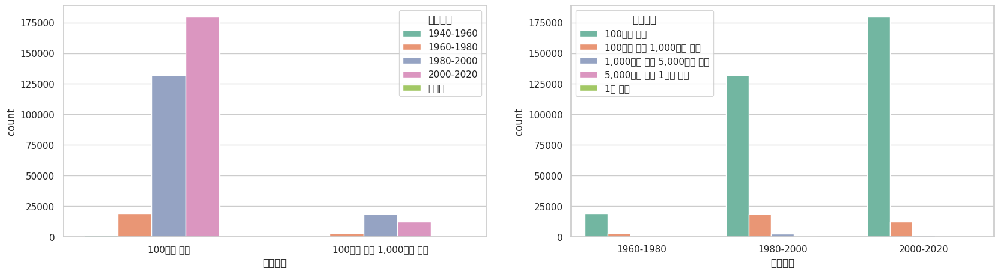

In [91]:
fig = plt.figure(figsize=(20, 5))

ax1 = fig.add_subplot(1, 2, 1)
ax2 = fig.add_subplot(1, 2, 2)

sns.countplot(x = '금액구간', hue = '생년구간', palette = 'Set2', data = b, ax = ax1)
sns.countplot(x = '생년구간', hue = '금액구간', palette = 'Set2', data = a, ax = ax2)

### df_age: 나이별 지역별 확인

In [92]:
df_age

,생년구간,광역시도명,법정시군구,등록일시,년월,일
19964,2010-2020,부산광역시,금정구,20220101000301547041,202201,01
17743,1980-1990,제주특별자치도,서귀포시,20220101000405617475,202201,01
1736,1980-1990,대구광역시,북구,20220101000659966130,202201,01
1555,2000-2010,경기도,남양주시,20220101000727580838,202201,01
1556,2000-2010,경기도,남양주시,20220101000727593818,202201,01
...,...,...,...,...,...,...
451792,2010-2020,광주광역시,서구,20231031234403532838,202310,31
446905,2000-2010,부산광역시,남구,20231031234453887005,202310,31
442907,1990-2000,인천광역시,계양구,20231031235154932113,202310,31
440905,1990-2000,서울특별시,관악구,20231031235454111073,202310,31


In [93]:
df_age.groupby(['년월'])['생년구간'].count()

년월
202201    22085
202202    24224
202203    25975
202204    20930
202205    23233
202206    24011
202207    27017
202208    28312
202209    27134
202210     4000
202211    24796
202212     5977
202301    30891
202302    23098
202303    31465
202304    16529
202305     8076
202306     8022
202307    31644
202308    12951
202309    18533
202310    12890
Name: 생년구간, dtype: int64

In [94]:
df_age_filt = pd.DataFrame(df_age.groupby(['년월', '생년구간', '광역시도명'])['생년구간'].count())
df_age_filt
df_age.sort_values('생년구간').tail(10) # 이상치 7 케이스

,생년구간,광역시도명,법정시군구,등록일시,년월,일
316987,2010-2020,서울특별시,강서구,20230310011524873096,202303,10
397013,2010-2020,경상남도,창원시의창구,20230719070956257646,202307,19
213194,2010-2020,전라북도,정읍시,20220928224514296346,202209,28
123070,2070-2080,서울특별시,강남구,20220602185446079926,202206,02
125753,2070-2080,경기도,평택시,20220623174858805022,202206,23
125514,2070-2080,광주광역시,동구,20220625000811701961,202206,25
125513,2070-2080,광주광역시,동구,20220625000207695724,202206,25
123069,2070-2080,서울특별시,강남구,20220602185445067179,202206,02
424637,2080-2090,경상남도,김해시,20230903010901517050,202309,03
28726,2090-2100,대전광역시,서구,20220202223236858042,202202,02


In [95]:
df_age.drop(df_age[(df_age['생년구간'] == '2070-2080') | (df_age['생년구간'] == '2080-2090')  | (df_age['생년구간'] == '2090-2100')].index, axis = 0, inplace = True)
df_age.groupby('생년구간')['생년구간'].count()

생년구간
1900-1910       125
1910-1920       158
1920-1930         1
1930-1940        67
1940-1950       412
1950-1960      1668
1960-1970      6094
1970-1980     22248
1980-1990     64698
1990-2000    122033
2000-2010    177067
2010-2020     57215
Name: 생년구간, dtype: int64

In [96]:
df_age.loc[df_age['생년구간'] == '1900-1910', '생년구간'] = '고령층'
df_age.loc[df_age['생년구간'] == '1910-1920', '생년구간'] = '고령층'
df_age.loc[df_age['생년구간'] == '1920-1930', '생년구간'] = '고령층'
df_age.loc[df_age['생년구간'] == '1930-1940', '생년구간'] = '고령층'
df_age[df_age['생년구간'] == '고령층']

df_age.loc[df_age['생년구간'] == '1940-1950', '생년구간'] = '1940-1960'
df_age.loc[df_age['생년구간'] == '1950-1960', '생년구간'] = '1940-1960'

df_age.loc[df_age['생년구간'] == '1960-1970', '생년구간'] = '1960-1980'
df_age.loc[df_age['생년구간'] == '1970-1980', '생년구간'] = '1960-1980'

df_age.loc[df_age['생년구간'] == '1980-1990', '생년구간'] = '1980-2000'
df_age.loc[df_age['생년구간'] == '1990-2000', '생년구간'] = '1980-2000'

df_age.loc[df_age['생년구간'] == '2000-2010', '생년구간'] = '2000-2020'
df_age.loc[df_age['생년구간'] == '2010-2020', '생년구간'] = '2000-2020'

In [97]:
df_age

# 광역시도명: '서울특별시', '부산광역시', '경기도', '대전광역시', '경상남도', '대구광역시', '인천광역시', '광주광역시',
# '충청북도', '울산광역시', '강원도', '전라남도', '경상북도', '충청남도', '전라북도', '제주특별자치도'


df_age.loc[df_age['광역시도명'] == 'Seoul', '광역시도명'] = '서울특별시'
df_age.loc[df_age['광역시도명'] == 'Incheo', '광역시도명'] = '인천광역시'
df_age.loc[df_age['광역시도명'] == '강원특별자치도', '광역시도명'] = '강원도'
df_age.loc[df_age['광역시도명'] == 'Busan', '광역시도명'] = '부산광역시'
df_age.loc[df_age['광역시도명'] == 'Gyeonggi-do', '광역시도명'] = '경기도'
df_age.loc[df_age['광역시도명'] == 'Daegu', '광역시도명'] = '대구광역시'

In [98]:
df_age.groupby(['년월', '생년구간', '광역시도명'])['생년구간'].count()

년월      생년구간       광역시도명
202201  1940-1960  강원도       1
                   경기도      20
                   경상남도      6
                   경상북도     12
                   광주광역시    10
                            ..
202310  고령층        대구광역시     1
                   대전광역시     2
                   서울특별시     5
                   충청남도      2
                   충청북도      3
Name: 생년구간, Length: 2038, dtype: int64

In [99]:
data_age = df_age.groupby(['년월', '생년구간', '광역시도명'])['생년구간'].count().unstack()
data_age = data_age.iloc[:, 188:] # 우선 영문 도시 모두 제외

In [100]:
data_age.fillna(0, inplace = True)
data_age

광역시도명                경기도   경상남도   경상북도  광주광역시  대구광역시  대전광역시  부산광역시   서울특별시  \
년월     생년구간                                                                  
202201 1940-1960    20.0    6.0   12.0   10.0    7.0    2.0   16.0    21.0   
       1960-1980   335.0   78.0   44.0   33.0  105.0   43.0   98.0   573.0   
       1980-2000  2214.0  398.0  300.0  257.0  369.0  231.0  521.0  3430.0   
       2000-2020  2461.0  527.0  417.0  301.0  479.0  364.0  676.0  3045.0   
       고령층           4.0    2.0    2.0    0.0    0.0    0.0    0.0     0.0   
...                  ...    ...    ...    ...    ...    ...    ...     ...   
202310 1940-1960     8.0    0.0    0.0    2.0    2.0    1.0    0.0    15.0   
       1960-1980   108.0   20.0   13.0   21.0   29.0   16.0   24.0   279.0   
       1980-2000  1017.0  191.0  140.0   95.0  201.0  106.0  213.0  2521.0   
       2000-2020  1353.0  272.0  226.0  146.0  242.0  164.0  369.0  2866.0   
       고령층           2.0    2.0    0.0    0.0    1.0    2.0    0.0     5.0   

광역시도명             울산광역시  인천광역시   전라남도   전라북도  제주특별자치도   충청남도   충청북도  
년월     생년구간                                                          
202201 1940-1960    0.0    1.0    4.0    0.0      4.0    2.0    6.0  
       1960-1980   20.0   91.0   24.0   33.0     10.0   35.0   30.0  
       1980-2000  138.0  535.0  170.0  164.0     76.0  349.0  262.0  
       2000-2020  190.0  589.0  247.0  323.0    100.0  451.0  330.0  
       고령층          0.0    1.0    0.0    0.0      0.0    0.0    0.0  
...                 ...    ...    ...    ...      ...    ...    ...  
202310 1940-1960    5.0    1.0    0.0    0.0      1.0    0.0    0.0  
       1960-1980    4.0   30.0   16.0   11.0      2.0   19.0   17.0  
       1980-2000   72.0  240.0   76.0   56.0     33.0  156.0  136.0  
       2000-2020  107.0  337.0  154.0  112.0     47.0  214.0  136.0  
       고령층          0.0    0.0    0.0    0.0      0.0    2.0    3.0  

[110 rows x 15 columns]

In [ ]:
data_age.plot.bar(rot=0, figsize = (25, 10))
plt.title("Monthly trend of region amount by age")
plt.xlabel("-")
plt.ylabel("count")
plt.ylim(0, 7000)
plt.show()

# 지역을 권역별로 묶기...?
# 수도권, 수도권 외 지역으로 묶어서

In [102]:
data = df_age[df_age['광역시도명'] == '서울특별시'].groupby(['년월', '생년구간', '광역시도명'])['생년구간'].count().unstack()
data

광역시도명             서울특별시
년월     생년구간            
202201 1940-1960     21
       1960-1980    573
       1980-2000   3430
       2000-2020   3045
202202 1940-1960     37
...                 ...
202310 1940-1960     15
       1960-1980    279
       1980-2000   2521
       2000-2020   2866
       고령층            5

[107 rows x 1 columns]

In [ ]:
data.plot.bar(rot=0, figsize = (15, 8))
plt.title("Monthly trend of region amount by age")
plt.xlabel("-")
plt.ylabel("count")
plt.ylim(0, 8000)
plt.show()

### df_sex: 지역별 성별 확인(창희님 부분과 중복되어 시각화 진행하지 않았음)

In [104]:
df_sex

,성별,광역시도명,법정시군구,등록일시,년월,일
4691,남자,부산광역시,금정구,20220101000301995033,202201,01
14137,여자,제주특별자치도,서귀포시,20220101000405491234,202201,01
1446,남자,대구광역시,북구,20220101000659662422,202201,01
1359,여자,경기도,남양주시,20220101000727284346,202201,01
1360,여자,경기도,남양주시,20220101000727292675,202201,01
...,...,...,...,...,...,...
448594,남자,광주광역시,서구,20231031234403529874,202310,31
443707,여자,부산광역시,남구,20231031234453890839,202310,31
439709,여자,인천광역시,계양구,20231031235154931854,202310,31
437707,남자,서울특별시,관악구,20231031235454098182,202310,31


In [105]:
df_sex.groupby(['년월', '성별', '광역시도명'])['광역시도명'].count()

년월      성별  광역시도명          
202201  남자  Alabama              1
            Bangkok              2
            BritishColumbia      1
            California           1
            CanTho               6
                              ... 
202310  여자  전라남도                72
            전라북도                56
            제주특별자치도             27
            충청남도               124
            충청북도                91
Name: 광역시도명, Length: 1363, dtype: int64

In [106]:
df_sex.loc[df_sex['광역시도명'] == 'Seoul', '광역시도명'] = '서울특별시'
df_sex.loc[df_sex['광역시도명'] == 'Incheo', '광역시도명'] = '인천광역시'
df_sex.loc[df_sex['광역시도명'] == '강원특별자치도', '광역시도명'] = '강원도'
df_sex.loc[df_sex['광역시도명'] == 'Busan', '광역시도명'] = '부산광역시'
df_sex.loc[df_sex['광역시도명'] == 'Gyeonggi-do', '광역시도명'] = '경기도'
df_sex.loc[df_sex['광역시도명'] == 'Daegu', '광역시도명'] = '대구광역시'

In [107]:
df_sex.groupby(['년월', '성별', '광역시도명'])['광역시도명'].count()
df_sex.groupby('광역시도명')['광역시도명'].count() # 이상치 제거: 국내 이외의 지역 제거

광역시도명
AbuDhabi        2
Aichi           4
Alabama         3
Alberta         4
AnGiang         1
            ...  
전라남도         8669
전라북도         9185
제주특별자치도      3516
충청남도        15922
충청북도        11200
Name: 광역시도명, Length: 204, dtype: int64

In [108]:
#eng = re.compile(r'[^ㄱ-ㅎ가-]', df_sex['광역시도명'])
#eng
df_sex.groupby('광역시도명')['광역시도명'].count().head(192).sum() # 2992 케이스 영문...
df_sex = df_sex.sort_values('광역시도명')[2992:]
df_sex.info()


<class 'pandas.core.frame.DataFrame'>
Index: 445603 entries, 403929 to 95069
Data columns (total 6 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   성별      445603 non-null  object
 1   광역시도명   445603 non-null  object
 2   법정시군구   445603 non-null  object
 3   등록일시    445603 non-null  object
 4   년월      445603 non-null  object
 5   일       445603 non-null  object
dtypes: object(6)
memory usage: 23.8+ MB


In [109]:
df_age.groupby(['년월', '생년구간', '광역시도명'])['생년구간'].count()

년월      생년구간       광역시도명
202201  1940-1960  강원도       1
                   경기도      20
                   경상남도      6
                   경상북도     12
                   광주광역시    10
                            ..
202310  고령층        대구광역시     1
                   대전광역시     2
                   서울특별시     5
                   충청남도      2
                   충청북도      3
Name: 생년구간, Length: 2038, dtype: int64

In [110]:
df_amt_month = df_amt.groupby(['년월']).count()
df_sex_month = df_sex.groupby(['년월'])
df_age_month = df_age.groupby(['년월'])

## geopandas 활용 지도 시각화

In [2]:
sigungu = gpd.read_file("./data/TL_SCCO_CTPRVN/TL_SCCO_CTPRVN.shp",encoding="cp949")
sigungu.rename(columns={'CTP_KOR_NM':'address'},inplace=True)
boundary = sigungu[['address','geometry']].set_index('address')

In [3]:
boundary_capital = sigungu[[x in ['서울특별시', '경기도'] for x in sigungu['address'].tolist()]]
boundary_capital = boundary_capital.loc[:,['address','geometry']]
boundary_capital.set_index('address',inplace=True)
boundary_no_capital = sigungu[[x not in ['서울특별시', '경기도'] for x in sigungu['address'].tolist()]]
boundary_no_capital = boundary_no_capital.loc[:,['address','geometry']]
boundary_no_capital.set_index('address',inplace=True)

## 지역 데이터 준비

In [4]:
folder_path = "./data/금융사기 피해자/지역"
file_names = os.listdir(folder_path)
df = pd.DataFrame()
for file_name in file_names:
    df_tmp = pd.read_csv(f"{folder_path}/{file_name}",header=None)
    df = pd.concat([df,df_tmp])

In [5]:
df.columns = ['id','birth_rate','address','legal','date']
df['age_10year'] = df['birth_rate'].apply(lambda o: o[:4]).astype(int)
df['date'] = df['date'].apply(lambda o: o[:6]).astype(int)

In [6]:
no_cap_address_lst = ['광주광역시','부산광역시','경상북도','인천광역시','전라남도','충청북도','대구광역시','강원도','대전광역시','충청남도','울산광역시','전라북도','경상남도','제주특별자치도']
years = sorted(df['age_10year'].unique().tolist())[:-3]

In [7]:
lst = []
for address in ['서울특별시', '경기도']:
    df_tmp = df[df['address']==address]
    for year in years:
        lst.append({
            "address":address,
            "age":year,
            "count":df_tmp[df_tmp['age_10year']==year].size
        })

In [8]:
df_capital = pd.DataFrame(lst)

In [9]:
lst = []
for address in no_cap_address_lst:
    df_tmp = df[df['address']==address]
    for year in years:
        lst.append({
            "address":address,
            "age":year,
            "count":df_tmp[df_tmp['age_10year']==year].size
        })

In [10]:
df_no_capital = pd.DataFrame(lst)

### 지도표시(수도권)

In [11]:
min_count, max_count = df_capital['count'].min(),df_capital['count'].max()

In [12]:
fig = px.choropleth_mapbox(data_frame=df_capital,
                           geojson=json.loads(boundary_capital.geometry.to_crs(epsg=4326).to_json()),
                           locations='address',
                           color='count',
                           center={'lat':37.50325824, 'lon':126.91476602},
                           mapbox_style='carto-positron',
                           zoom=7,
                           color_continuous_scale='Viridis',
                           range_color=(min_count, max_count),
                           animation_frame='age',
                           width=800,
                           height=600)
fig.write_html('연령별 지역 피해 지도(수도권).html')
fig.show()

### 지도표시(비수도권)

In [13]:
min_count, max_count = df_no_capital['count'].min(),df_no_capital['count'].max()

In [14]:
fig = px.choropleth_mapbox(data_frame=df_no_capital,
                           geojson=json.loads(boundary_no_capital.geometry.to_crs(epsg=4326).to_json()),
                           locations='address',
                           color='count',
                           center={'lat':36.33, 'lon':127.2},
                           mapbox_style='carto-positron',
                           zoom=5,
                           color_continuous_scale='Viridis',
                           range_color=(min_count, max_count),
                           animation_frame='age',
                           width=800,
                           height=600)
fig.write_html('연령별 지역 피해 지도(비수도권).html')
fig.show()